### CNN per previsione multistep di serie multivariata

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import time
from pandas.plotting import lag_plot
from pandas.plotting import autocorrelation_plot
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error 
from math import sqrt
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
import warnings 
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split


data = pd.read_csv('/Users/alket/Desktop/dati/new_data_backfill_forwfill.csv',index_col = 0)

# preparazione dati per due celle
agg_by_cell = data.groupby(by = ['cell_num'])

cell_1 = agg_by_cell.get_group('496-1258')
cell_2 = agg_by_cell.get_group('496-1257')
cell_3 = agg_by_cell.get_group('496-1259')

cell_4 = agg_by_cell.get_group('495-1257')
cell_5 = agg_by_cell.get_group('495-1259')

cell_6 = agg_by_cell.get_group('495-1258')

cell_7 = agg_by_cell.get_group('497-1258')
cell_8 = agg_by_cell.get_group('497-1259')
cell_9 = agg_by_cell.get_group('497-1257')

# define input sequence
series1 = cell_1['nr_people'].values
series2 = cell_2['nr_people'].values
series3 = cell_3['nr_people'].values

series4 = cell_4['nr_people'].values
series5 = cell_5['nr_people'].values
series6 = cell_6['nr_people'].values

series7 = cell_7['nr_people'].values
series8 = cell_8['nr_people'].values
series9 = cell_9['nr_people'].values


In [2]:
cell_1 = agg_by_cell.get_group('493-1259')
cell_2 = agg_by_cell.get_group('487-1260')
cell_3 = agg_by_cell.get_group('498-1265')
cell_4 = agg_by_cell.get_group('491-1264')
cell_5 = agg_by_cell.get_group('488-1253')

cell_6 = agg_by_cell.get_group('487-1268')
cell_7 = agg_by_cell.get_group('498-1253')
cell_8 = agg_by_cell.get_group('493-1254')
cell_9 = agg_by_cell.get_group('498-1262')


# define input sequence
series1 = cell_1['nr_people'].values
series2 = cell_2['nr_people'].values
series3 = cell_3['nr_people'].values

series4 = cell_4['nr_people'].values
series5 = cell_5['nr_people'].values
series6 = cell_6['nr_people'].values

series7 = cell_7['nr_people'].values
series8 = cell_8['nr_people'].values
series9 = cell_9['nr_people'].values


In [3]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        # check if we are beyond the dataset
        if out_end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)


# convert to [rows, columns] structure
series1 = series1.reshape((len(series1), 1))
series2 = series2.reshape((len(series2), 1))
series3 = series3.reshape((len(series3), 1))

series4 = series4.reshape((len(series4), 1))
series5 = series5.reshape((len(series5), 1))
series6 = series6.reshape((len(series6), 1))

series7 = series7.reshape((len(series7), 1))
series8 = series8.reshape((len(series8), 1))
series9 = series9.reshape((len(series9), 1))
#out_seq = out_seq.reshape((len(out_seq), 1))

# horizontally stack columns
dataset = hstack((series1, series2, series3, series4, series5, series6, series7, series8, series9))

# choose a number of time steps
n_steps_in, n_steps_out = 10, 10

# convert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)
counter = 0
for i in range(len(X)):
    print(X[i], y[i])
    counter += 1
    if counter > 3: break
# flatten output
n_output = y.shape[1] * y.shape[2]
y = y.reshape((y.shape[0], n_output))

# the dataset knows the number of features, e.g. 2
n_features = X.shape[2]

[[103.  41.  17.  25. 205. 124. 176. 261.  17.]
 [106.  41.  17.  25. 201. 124. 176. 256.  17.]
 [ 98.  40.  17.  24. 189. 122. 176. 242.  17.]
 [ 96.  39.  17.  24. 184. 120. 176. 236.  17.]
 [ 91.  37.  16.  24. 178. 120. 177. 229.  17.]
 [ 89.  36.  17.  24. 180. 120. 177. 232.  17.]
 [ 86.  34.  17.  24. 173. 120. 180. 224.  17.]
 [ 83.  34.  17.  23. 166. 118. 180. 215.  17.]
 [ 81.  33.  17.  23. 164. 118. 179. 214.  17.]
 [ 78.  31.  17.  22. 157. 116. 178. 207.  17.]] [[ 76.  29.  17.  22. 154. 114. 179. 202.  17.]
 [ 72.  28.  17.  21. 143. 111. 180. 190.  17.]
 [ 72.  28.  17.  21. 143. 111. 180. 190.  17.]
 [ 69.  26.  17.  20. 129. 106. 179. 174.  17.]
 [ 66.  24.  16.  20. 124. 103. 180. 167.  17.]
 [ 65.  24.  16.  19. 117. 101. 179. 157.  17.]
 [ 64.  23.  16.  19. 112. 100. 179. 151.  17.]
 [ 67.  22.  17.  19. 110. 100. 180. 147.  17.]
 [ 66.  22.  17.  19. 105.  99. 179. 141.  17.]
 [ 68.  22.  17.  19. 101.  99. 180. 136.  17.]]
[[106.  41.  17.  25. 201. 124. 176. 2

 [116.  38.  16.  22. 154. 105. 167. 192.  17.]]
[[ 71.  24.  16.  19. 100.  96. 177. 128.  17.]
 [ 71.  24.  16.  19. 100.  96. 177. 128.  17.]
 [ 71.  24.  16.  19. 100.  96. 177. 128.  17.]
 [ 71.  24.  16.  19. 100.  96. 177. 128.  17.]
 [ 71.  24.  16.  19. 100.  96. 177. 128.  17.]
 [ 71.  24.  16.  19. 100.  96. 177. 128.  17.]
 [ 73.  23.  16.  18. 115.  94. 176. 150.  16.]
 [ 73.  23.  16.  18. 115.  94. 176. 150.  16.]
 [ 73.  23.  16.  18. 115.  94. 176. 150.  16.]
 [ 75.  25.  16.  19. 104.  96. 174. 132.  17.]] [[ 75.  25.  16.  19. 104.  96. 174. 132.  17.]
 [ 75.  25.  16.  19. 104.  96. 174. 132.  17.]
 [ 79.  26.  16.  19.  99.  96. 178. 125.  17.]
 [ 79.  26.  16.  19.  99.  96. 178. 125.  17.]
 [ 79.  26.  16.  19.  99.  96. 178. 125.  17.]
 [ 79.  26.  16.  19.  99.  96. 178. 125.  17.]
 [ 79.  26.  16.  19.  99.  96. 178. 125.  17.]
 [112.  36.  17.  22. 140. 102. 168. 171.  18.]
 [116.  38.  16.  22. 154. 105. 167. 192.  17.]
 [122.  39.  16.  23. 167. 106. 165. 2

 [177.  61.  18.  34. 292. 146. 173. 316.  18.]]
[[136.  35.  18.  25. 158. 111. 175. 190.  18.]
 [143.  37.  20.  25. 174. 113. 176. 209.  20.]
 [159.  42.  18.  27. 195. 117. 174. 241.  18.]
 [159.  42.  18.  27. 214. 118. 176. 264.  18.]
 [153.  45.  17.  27. 211. 120. 169. 256.  17.]
 [158.  44.  18.  29. 203. 121. 166. 246.  18.]
 [156.  44.  18.  29. 215. 124. 166. 260.  18.]
 [158.  46.  17.  30. 228. 127. 171. 276.  17.]
 [162.  47.  17.  30. 230. 126. 170. 278.  17.]
 [161.  48.  17.  30. 220. 129. 174. 256.  18.]] [[163.  48.  18.  31. 232. 130. 173. 254.  18.]
 [163.  48.  18.  31. 232. 130. 173. 254.  18.]
 [163.  48.  18.  31. 232. 130. 173. 254.  18.]
 [167.  51.  18.  31. 242. 134. 181. 250.  19.]
 [165.  52.  17.  32. 245. 136. 173. 252.  18.]
 [168.  53.  17.  32. 255. 138. 177. 261.  17.]
 [168.  53.  17.  32. 255. 138. 177. 261.  17.]
 [179.  57.  18.  34. 284. 143. 173. 306.  18.]
 [177.  61.  18.  34. 292. 146. 173. 316.  18.]
 [187.  64.  18.  34. 303. 146. 175. 3

 [134.  65.  20.  43. 301. 171. 183. 274.  20.]]
[[109.  51.  19.  36. 236. 148. 160. 188.  18.]
 [114.  53.  19.  38. 238. 152. 163. 190.  19.]
 [110.  54.  19.  37. 235. 153. 162. 190.  18.]
 [111.  55.  19.  38. 234. 155. 165. 192.  18.]
 [111.  55.  19.  38. 234. 155. 165. 192.  18.]
 [115.  57.  19.  39. 242. 160. 164. 201.  18.]
 [120.  59.  19.  40. 251. 164. 161. 203.  18.]
 [122.  61.  19.  42. 261. 169. 165. 209.  18.]
 [124.  62.  18.  42. 271. 169. 163. 219.  17.]
 [120.  62.  18.  41. 270. 171. 168. 217.  18.]] [[124.  63.  19.  42. 279. 176. 170. 220.  18.]
 [130.  66.  18.  44. 284. 180. 169. 220.  18.]
 [133.  66.  19.  44. 286. 176. 167. 227.  18.]
 [136.  66.  19.  44. 299. 176. 172. 247.  19.]
 [138.  66.  19.  44. 303. 171. 175. 258.  19.]
 [133.  65.  19.  43. 302. 168. 183. 262.  19.]
 [132.  64.  19.  42. 302. 166. 184. 269.  19.]
 [132.  64.  19.  42. 302. 166. 184. 269.  19.]
 [134.  65.  20.  43. 301. 171. 183. 274.  20.]
 [135.  64.  21.  44. 301. 170. 190. 2

 [130.  68.  20.  39. 307. 142. 197. 357.  19.]] [[132.  66.  19.  38. 320. 141. 198. 379.  18.]
 [125.  66.  19.  37. 326. 140. 198. 388.  18.]
 [124.  67.  20.  37. 330. 142. 200. 391.  19.]
 [116.  65.  19.  36. 324. 141. 200. 389.  18.]
 [115.  61.  19.  34. 311. 139. 200. 372.  19.]
 [113.  58.  19.  34. 302. 138. 199. 360.  19.]
 [113.  58.  19.  34. 302. 138. 199. 360.  19.]
 [109.  56.  20.  33. 287. 136. 195. 342.  19.]
 [104.  54.  19.  32. 274. 135. 200. 329.  18.]
 [101.  53.  19.  32. 259. 134. 200. 311.  18.]]
[[133.  68.  17.  39. 305. 139. 190. 348.  17.]
 [136.  67.  17.  39. 308. 138. 191. 351.  17.]
 [136.  67.  17.  39. 308. 138. 191. 351.  17.]
 [136.  67.  17.  39. 308. 138. 191. 351.  17.]
 [139.  69.  19.  40. 313. 139. 197. 362.  18.]
 [138.  69.  19.  40. 311. 140. 196. 360.  18.]
 [135.  69.  19.  40. 315. 143. 196. 363.  19.]
 [133.  69.  20.  40. 310. 143. 197. 362.  19.]
 [130.  68.  20.  39. 307. 142. 197. 357.  19.]
 [132.  66.  19.  38. 320. 141. 198. 3

 [150.  69.  19.  43. 358. 154. 215. 422.  19.]] [[150.  69.  19.  43. 358. 154. 215. 422.  19.]
 [133.  62.  19.  38. 368. 149. 201. 440.  18.]
 [127.  59.  20.  37. 351. 147. 203. 420.  19.]
 [122.  57.  19.  36. 341. 146. 200. 409.  18.]
 [118.  56.  19.  35. 329. 144. 200. 394.  19.]
 [115.  53.  19.  34. 312. 143. 203. 376.  19.]
 [115.  53.  19.  34. 312. 143. 203. 376.  19.]
 [111.  52.  19.  34. 297. 141. 199. 360.  18.]
 [107.  53.  19.  34. 291. 145. 200. 353.  19.]
 [107.  53.  19.  34. 291. 145. 200. 353.  19.]]
[[136.  66.  18.  41. 358. 144. 203. 418.  17.]
 [148.  65.  19.  41. 337. 149. 218. 397.  18.]
 [150.  67.  19.  43. 340. 151. 222. 403.  19.]
 [146.  68.  19.  42. 361. 151. 223. 430.  18.]
 [149.  69.  19.  43. 358. 152. 219. 423.  18.]
 [150.  69.  19.  43. 358. 154. 215. 422.  19.]
 [150.  69.  19.  43. 358. 154. 215. 422.  19.]
 [150.  69.  19.  43. 358. 154. 215. 422.  19.]
 [150.  69.  19.  43. 358. 154. 215. 422.  19.]
 [150.  69.  19.  43. 358. 154. 215. 4

 [ 89.  50.  17.  31. 246. 141. 179. 306.  17.]]
[[120.  68.  17.  41. 338. 155. 180. 401.  17.]
 [121.  66.  17.  40. 351. 154. 180. 416.  17.]
 [119.  65.  17.  40. 349. 154. 181. 417.  18.]
 [117.  64.  17.  39. 346. 151. 184. 414.  17.]
 [115.  64.  17.  38. 344. 154. 178. 412.  17.]
 [118.  64.  17.  38. 342. 156. 185. 416.  17.]
 [113.  63.  18.  37. 337. 155. 177. 408.  18.]
 [111.  62.  18.  36. 327. 152. 179. 397.  17.]
 [109.  60.  18.  35. 314. 149. 177. 383.  18.]
 [108.  58.  18.  35. 302. 147. 181. 369.  18.]] [[109.  57.  18.  34. 296. 146. 179. 363.  18.]
 [106.  56.  18.  34. 293. 147. 179. 361.  18.]
 [101.  55.  18.  33. 275. 146. 179. 339.  18.]
 [ 98.  53.  17.  32. 274. 144. 178. 335.  17.]
 [ 96.  53.  18.  32. 265. 145. 176. 326.  18.]
 [ 96.  52.  17.  32. 260. 143. 179. 322.  17.]
 [ 92.  50.  17.  31. 252. 141. 178. 313.  17.]
 [ 92.  50.  17.  32. 249. 142. 179. 310.  17.]
 [ 89.  50.  17.  31. 246. 141. 179. 306.  17.]
 [ 93.  50.  17.  32. 247. 143. 180. 3

 [ 60.  29.  17.  22. 138. 114. 195. 181.  17.]]
[[ 89.  49.  16.  31. 219. 135. 188. 266.  16.]
 [ 89.  51.  16.  32. 215. 138. 187. 265.  16.]
 [ 90.  52.  16.  32. 221. 140. 190. 277.  16.]
 [ 90.  52.  16.  32. 221. 140. 190. 277.  16.]
 [ 88.  50.  16.  31. 218. 134. 191. 276.  16.]
 [ 80.  47.  16.  28. 206. 131. 193. 261.  16.]
 [ 77.  44.  16.  27. 199. 130. 192. 252.  16.]
 [ 77.  44.  16.  27. 199. 130. 192. 252.  16.]
 [ 74.  41.  17.  26. 185. 128. 194. 234.  16.]
 [ 74.  41.  17.  26. 185. 128. 194. 234.  16.]] [[ 72.  39.  17.  26. 173. 126. 194. 221.  17.]
 [ 71.  38.  17.  25. 166. 124. 195. 213.  17.]
 [ 69.  38.  17.  25. 163. 125. 196. 210.  17.]
 [ 67.  37.  17.  24. 161. 125. 197. 207.  17.]
 [ 67.  36.  17.  24. 158. 123. 196. 205.  17.]
 [ 67.  36.  17.  24. 158. 123. 196. 205.  17.]
 [ 65.  32.  17.  23. 150. 119. 195. 195.  17.]
 [ 61.  31.  17.  22. 146. 116. 196. 189.  17.]
 [ 60.  29.  17.  22. 138. 114. 195. 181.  17.]
 [ 60.  29.  17.  21. 134. 112. 195. 1

 [ 67.  26.  18.  23. 123. 102. 200. 156.  18.]] [[ 66.  26.  18.  23. 127. 102. 198. 166.  18.]
 [ 65.  24.  18.  22. 136. 102. 195. 175.  18.]
 [ 61.  23.  18.  21. 138.  98. 195. 177.  18.]
 [ 62.  22.  18.  21. 138.  96. 195. 180.  18.]
 [ 62.  22.  17.  21. 134.  97. 195. 175.  18.]
 [ 64.  23.  17.  21. 134.  97. 193. 177.  18.]
 [ 62.  23.  17.  21. 131.  96. 194. 170.  18.]
 [ 64.  23.  17.  21. 127.  97. 191. 166.  17.]
 [ 67.  24.  17.  22. 128.  98. 189. 166.  18.]
 [ 69.  26.  17.  23. 131.  97. 186. 168.  17.]]
[[ 65.  26.  18.  21. 130. 106. 201. 169.  18.]
 [ 65.  26.  18.  21. 128. 106. 203. 165.  18.]
 [ 65.  26.  18.  21. 126. 106. 202. 162.  18.]
 [ 66.  25.  18.  21. 126. 106. 202. 163.  18.]
 [ 66.  25.  18.  21. 128. 104. 202. 163.  18.]
 [ 69.  24.  18.  22. 126. 103. 200. 159.  18.]
 [ 67.  25.  18.  22. 125. 103. 201. 158.  18.]
 [ 67.  26.  18.  23. 125. 103. 201. 160.  18.]
 [ 67.  26.  18.  23. 123. 102. 200. 156.  18.]
 [ 66.  26.  18.  23. 127. 102. 198. 1

 [115.  41.  20.  32. 194. 112. 179. 233.  19.]] [[121.  46.  18.  34. 213. 115. 176. 253.  18.]
 [121.  47.  18.  34. 215. 119. 173. 260.  18.]
 [119.  48.  19.  34. 212. 120. 173. 252.  18.]
 [115.  48.  19.  34. 215. 121. 173. 255.  18.]
 [112.  49.  18.  34. 214. 123. 175. 255.  18.]
 [115.  50.  19.  35. 212. 124. 171. 250.  18.]
 [118.  49.  19.  35. 216. 121. 177. 253.  19.]
 [122.  48.  19.  35. 221. 120. 171. 258.  18.]
 [124.  47.  18.  35. 221. 117. 170. 261.  17.]
 [125.  46.  19.  34. 217. 115. 170. 255.  18.]]
[[ 95.  30.  19.  28. 145. 118. 199. 182.  19.]
 [ 98.  32.  20.  29. 142. 119. 196. 179.  20.]
 [ 98.  32.  20.  29. 142. 119. 196. 179.  20.]
 [107.  33.  20.  30. 145. 116. 193. 178.  20.]
 [106.  35.  20.  30. 156. 113. 192. 188.  19.]
 [106.  35.  20.  30. 156. 113. 192. 188.  19.]
 [109.  38.  19.  32. 167. 109. 186. 199.  19.]
 [113.  39.  21.  31. 182. 110. 184. 215.  20.]
 [115.  41.  20.  32. 194. 112. 179. 233.  19.]
 [121.  46.  18.  34. 213. 115. 176. 2

 [137.  40.  18.  36. 190. 116. 170. 238.  17.]] [[133.  42.  18.  37. 187. 121. 173. 235.  18.]
 [136.  43.  18.  37. 193. 121. 170. 240.  18.]
 [134.  43.  18.  37. 193. 122. 170. 238.  17.]
 [134.  44.  18.  37. 203. 126. 169. 252.  17.]
 [136.  47.  19.  38. 217. 133. 168. 270.  18.]
 [134.  51.  18.  38. 218. 135. 172. 266.  18.]
 [129.  53.  18.  38. 225. 133. 172. 271.  18.]
 [128.  54.  19.  38. 230. 132. 176. 275.  19.]
 [127.  55.  19.  38. 229. 132. 181. 276.  19.]
 [128.  55.  19.  38. 236. 132. 178. 281.  19.]]
[[127.  34.  18.  32. 158. 109. 176. 199.  17.]
 [124.  34.  18.  32. 159. 110. 181. 200.  17.]
 [126.  34.  18.  33. 163. 112. 171. 203.  17.]
 [125.  34.  17.  32. 164. 112. 171. 203.  17.]
 [126.  34.  18.  32. 165. 112. 171. 204.  17.]
 [131.  35.  18.  33. 165. 111. 173. 205.  18.]
 [133.  37.  19.  34. 179. 115. 175. 224.  18.]
 [134.  38.  18.  35. 178. 117. 171. 224.  17.]
 [137.  40.  18.  36. 190. 116. 170. 238.  17.]
 [133.  42.  18.  37. 187. 121. 173. 2

 [158.  70.  20.  46. 372. 159. 196. 447.  20.]]
[[123.  54.  19.  38. 286. 134. 173. 347.  18.]
 [126.  56.  19.  38. 287. 137. 174. 350.  19.]
 [130.  58.  19.  39. 286. 140. 178. 348.  19.]
 [125.  59.  19.  39. 292. 140. 181. 356.  18.]
 [125.  59.  19.  39. 292. 140. 181. 356.  18.]
 [130.  60.  20.  40. 315. 145. 182. 385.  19.]
 [132.  61.  19.  40. 321. 148. 177. 395.  19.]
 [132.  61.  19.  40. 321. 148. 177. 395.  19.]
 [135.  62.  18.  41. 322. 147. 182. 395.  18.]
 [145.  62.  19.  43. 334. 146. 184. 405.  18.]] [[142.  61.  19.  42. 332. 143. 182. 404.  19.]
 [142.  62.  19.  42. 338. 144. 185. 411.  19.]
 [142.  63.  19.  42. 350. 145. 187. 419.  19.]
 [144.  65.  20.  43. 364. 148. 188. 437.  20.]
 [144.  65.  20.  43. 364. 148. 188. 437.  20.]
 [147.  67.  19.  44. 373. 153. 191. 451.  19.]
 [147.  67.  19.  44. 373. 153. 191. 451.  19.]
 [147.  67.  19.  44. 373. 153. 191. 451.  19.]
 [158.  70.  20.  46. 372. 159. 196. 447.  20.]
 [153.  71.  20.  46. 369. 158. 206. 4

 [121.  62.  17.  39. 319. 143. 182. 375.  17.]] [[118.  61.  17.  37. 322. 139. 184. 383.  17.]
 [117.  60.  17.  37. 315. 139. 185. 380.  17.]
 [116.  59.  18.  36. 308. 142. 186. 371.  18.]
 [118.  59.  17.  37. 312. 141. 183. 378.  17.]
 [114.  60.  18.  36. 303. 140. 185. 364.  17.]
 [117.  57.  18.  36. 300. 136. 183. 362.  18.]
 [113.  56.  19.  35. 293. 136. 187. 356.  19.]
 [110.  54.  17.  34. 282. 132. 185. 345.  17.]
 [108.  52.  18.  33. 278. 131. 186. 341.  18.]
 [105.  52.  18.  32. 275. 129. 189. 339.  18.]]
[[127.  59.  17.  38. 292. 136. 188. 329.  17.]
 [130.  60.  18.  39. 300. 137. 185. 340.  17.]
 [131.  61.  17.  39. 316. 140. 185. 362.  17.]
 [123.  61.  17.  38. 314. 137. 184. 363.  17.]
 [126.  60.  17.  38. 310. 135. 182. 357.  17.]
 [126.  60.  17.  38. 310. 135. 182. 357.  17.]
 [131.  62.  17.  39. 316. 142. 185. 369.  17.]
 [127.  63.  17.  39. 318. 142. 182. 372.  17.]
 [121.  62.  17.  39. 319. 143. 182. 375.  17.]
 [118.  61.  17.  37. 322. 139. 184. 3

 [ 88.  41.  16.  28. 189. 127. 194. 242.  16.]] [[ 91.  41.  16.  29. 184. 124. 195. 235.  16.]
 [ 87.  40.  16.  28. 184. 123. 197. 235.  16.]
 [ 86.  40.  16.  27. 178. 123. 196. 228.  16.]
 [ 81.  38.  17.  27. 173. 122. 199. 223.  17.]
 [ 75.  36.  17.  25. 164. 120. 198. 211.  16.]
 [ 73.  35.  16.  24. 157. 118. 198. 204.  16.]
 [ 72.  34.  16.  24. 152. 117. 198. 199.  16.]
 [ 71.  33.  17.  24. 147. 117. 198. 193.  16.]
 [ 72.  33.  17.  24. 144. 116. 198. 187.  17.]
 [ 71.  32.  17.  23. 139. 115. 199. 181.  17.]]
[[ 95.  43.  16.  29. 210. 122. 190. 266.  16.]
 [ 99.  43.  16.  30. 210. 122. 194. 266.  16.]
 [ 99.  43.  16.  30. 210. 122. 194. 266.  16.]
 [ 93.  42.  17.  29. 199. 125. 194. 254.  16.]
 [ 92.  42.  16.  29. 196. 126. 193. 250.  16.]
 [ 90.  41.  16.  29. 188. 126. 194. 239.  16.]
 [ 90.  39.  16.  28. 185. 125. 194. 235.  16.]
 [ 89.  40.  16.  28. 189. 126. 194. 242.  16.]
 [ 88.  41.  16.  28. 189. 127. 194. 242.  16.]
 [ 91.  41.  16.  29. 184. 124. 195. 2

 [ 56.  23.  18.  19. 109. 110. 203. 148.  17.]] [[ 56.  23.  18.  19. 107. 109. 201. 144.  18.]
 [ 58.  23.  18.  20. 105. 108. 203. 141.  18.]
 [ 59.  23.  18.  20. 102. 108. 202. 137.  18.]
 [ 62.  24.  18.  21. 103. 108. 204. 136.  18.]
 [ 58.  25.  18.  21. 106. 108. 203. 139.  18.]
 [ 59.  27.  18.  22. 105. 109. 203. 138.  18.]
 [ 61.  28.  18.  22. 109. 107. 201. 144.  18.]
 [ 61.  28.  18.  22. 109. 107. 201. 144.  18.]
 [ 61.  26.  18.  21. 123. 110. 201. 165.  17.]
 [ 64.  25.  18.  22. 128. 111. 198. 170.  18.]]
[[ 62.  29.  18.  21. 139. 116. 205. 185.  18.]
 [ 61.  28.  18.  21. 134. 116. 205. 178.  18.]
 [ 60.  27.  18.  20. 130. 114. 205. 174.  18.]
 [ 59.  26.  18.  20. 125. 113. 203. 168.  17.]
 [ 57.  26.  18.  20. 122. 112. 203. 164.  17.]
 [ 57.  25.  18.  19. 119. 112. 204. 161.  17.]
 [ 55.  24.  18.  19. 118. 112. 204. 159.  17.]
 [ 57.  24.  18.  19. 114. 111. 204. 154.  17.]
 [ 56.  23.  18.  19. 109. 110. 203. 148.  17.]
 [ 56.  23.  18.  19. 107. 109. 201. 1

 [ 96.  30.  20.  28. 135. 119. 201. 170.  19.]] [[100.  30.  22.  29. 127. 114. 206. 155.  21.]
 [ 99.  29.  21.  28. 133. 110. 200. 162.  20.]
 [105.  29.  22.  29. 136. 109. 209. 166.  21.]
 [107.  30.  21.  29. 145. 107. 203. 171.  20.]
 [107.  30.  21.  29. 145. 107. 203. 171.  20.]
 [107.  30.  21.  29. 145. 107. 203. 171.  20.]
 [114.  36.  20.  31. 166. 105. 185. 194.  19.]
 [116.  38.  20.  32. 188. 107. 182. 215.  20.]
 [113.  41.  19.  32. 201. 107. 179. 229.  19.]
 [113.  41.  19.  32. 201. 107. 179. 229.  19.]]
[[ 69.  30.  19.  25. 122. 113. 212. 153.  19.]
 [ 69.  29.  19.  24. 120. 115. 211. 153.  18.]
 [ 67.  28.  19.  24. 122. 117. 207. 152.  18.]
 [ 70.  27.  19.  24. 129. 116. 204. 162.  18.]
 [ 72.  27.  19.  24. 133. 118. 205. 168.  18.]
 [ 82.  27.  19.  26. 133. 118. 204. 165.  18.]
 [ 87.  27.  18.  27. 130. 117. 210. 163.  18.]
 [ 88.  29.  20.  27. 133. 119. 204. 167.  19.]
 [ 96.  30.  20.  28. 135. 119. 201. 170.  19.]
 [100.  30.  22.  29. 127. 114. 206. 1

 [ 96.  25.  19.  27. 117. 113. 201. 158.  18.]] [[ 97.  25.  19.  27. 118. 111. 195. 154.  18.]
 [101.  27.  19.  28. 133. 110. 196. 173.  18.]
 [103.  29.  22.  30. 136. 111. 195. 174.  21.]
 [103.  29.  22.  30. 136. 111. 195. 174.  21.]
 [103.  34.  19.  31. 151. 110. 181. 184.  18.]
 [109.  37.  19.  33. 160. 112. 181. 192.  18.]
 [106.  38.  20.  32. 168. 110. 176. 199.  19.]
 [115.  39.  20.  33. 185. 110. 172. 221.  19.]
 [117.  40.  19.  34. 199. 111. 169. 241.  18.]
 [117.  40.  19.  34. 199. 111. 169. 241.  18.]]
[[ 75.  29.  19.  25. 112. 114. 212. 151.  19.]
 [ 76.  28.  19.  25. 116. 113. 211. 158.  19.]
 [ 74.  26.  19.  23. 122. 114. 206. 167.  18.]
 [ 74.  26.  19.  23. 122. 114. 206. 167.  18.]
 [ 78.  24.  19.  24. 132. 113. 206. 176.  18.]
 [ 84.  24.  19.  25. 132. 111. 206. 177.  18.]
 [ 87.  25.  19.  25. 130. 111. 206. 174.  18.]
 [ 87.  25.  19.  25. 130. 111. 206. 174.  18.]
 [ 96.  25.  19.  27. 117. 113. 201. 158.  18.]
 [ 97.  25.  19.  27. 118. 111. 195. 1

 [124.  53.  20.  37. 235. 125. 156. 281.  19.]]
[[ 86.  30.  19.  27. 149. 119. 201. 204.  19.]
 [ 95.  30.  19.  28. 153. 119. 204. 206.  19.]
 [ 96.  31.  20.  29. 150. 119. 206. 202.  20.]
 [104.  31.  21.  30. 152. 118. 207. 205.  21.]
 [108.  31.  22.  30. 161. 117. 210. 212.  22.]
 [116.  33.  21.  32. 162. 117. 203. 214.  21.]
 [114.  35.  22.  33. 168. 118. 197. 215.  21.]
 [117.  38.  20.  34. 168. 116. 184. 214.  20.]
 [116.  42.  21.  34. 181. 118. 178. 227.  20.]
 [122.  45.  21.  36. 201. 117. 176. 250.  20.]] [[119.  46.  22.  35. 216. 114. 177. 263.  21.]
 [120.  49.  21.  36. 217. 118. 167. 262.  20.]
 [129.  51.  21.  37. 236. 120. 167. 284.  20.]
 [126.  53.  19.  38. 247. 120. 166. 302.  18.]
 [127.  56.  20.  39. 244. 127. 164. 299.  19.]
 [129.  55.  20.  39. 236. 126. 165. 284.  19.]
 [131.  52.  20.  38. 236. 126. 165. 285.  19.]
 [132.  53.  20.  39. 229. 125. 162. 277.  19.]
 [124.  53.  20.  37. 235. 125. 156. 281.  19.]
 [124.  53.  20.  37. 235. 125. 156. 2

 [ 98.  44.  17.  31. 211. 116. 179. 246.  17.]]
[[ 76.  28.  18.  24. 136. 105. 194. 172.  17.]
 [ 82.  35.  18.  27. 152. 114. 192. 190.  18.]
 [ 86.  36.  19.  28. 152. 114. 186. 192.  18.]
 [ 90.  37.  19.  28. 154. 114. 192. 196.  19.]
 [ 89.  36.  19.  28. 167. 113. 186. 211.  18.]
 [ 94.  37.  18.  29. 170. 113. 186. 215.  18.]
 [ 92.  37.  18.  29. 176. 112. 183. 218.  17.]
 [ 90.  38.  18.  29. 175. 113. 184. 217.  18.]
 [ 94.  38.  18.  29. 173. 113. 180. 212.  18.]
 [ 89.  39.  19.  28. 177. 113. 181. 215.  19.]] [[ 89.  39.  19.  28. 177. 113. 181. 215.  19.]
 [ 92.  38.  19.  29. 176. 108. 177. 211.  18.]
 [ 88.  38.  19.  28. 185. 107. 177. 221.  18.]
 [ 88.  38.  19.  28. 185. 107. 177. 221.  18.]
 [ 88.  38.  19.  28. 185. 107. 177. 221.  18.]
 [ 90.  40.  18.  29. 191. 112. 175. 221.  18.]
 [ 96.  41.  18.  30. 199. 115. 177. 229.  18.]
 [ 98.  44.  17.  31. 211. 116. 179. 246.  17.]
 [ 98.  44.  17.  31. 211. 116. 179. 246.  17.]
 [ 98.  44.  17.  31. 211. 116. 179. 2

 [128.  62.  20.  39. 333. 141. 192. 393.  18.]]
[[ 99.  48.  18.  32. 203. 121. 181. 242.  18.]
 [105.  49.  19.  33. 223. 123. 183. 262.  18.]
 [113.  51.  19.  35. 233. 130. 181. 276.  18.]
 [114.  52.  19.  36. 244. 130. 180. 288.  18.]
 [112.  51.  19.  35. 249. 128. 181. 293.  18.]
 [112.  51.  19.  35. 249. 128. 181. 293.  18.]
 [112.  53.  19.  35. 261. 127. 184. 302.  19.]
 [117.  55.  18.  35. 265. 130. 186. 309.  18.]
 [122.  56.  18.  36. 274. 132. 188. 316.  17.]
 [117.  57.  18.  36. 295. 136. 187. 345.  18.]] [[119.  59.  18.  37. 313. 139. 189. 365.  18.]
 [127.  61.  18.  38. 324. 140. 186. 377.  17.]
 [136.  61.  19.  39. 324. 139. 187. 374.  18.]
 [133.  61.  19.  38. 331. 138. 197. 383.  18.]
 [133.  61.  19.  38. 331. 138. 197. 383.  18.]
 [132.  63.  19.  40. 327. 141. 188. 382.  19.]
 [138.  62.  19.  40. 345. 140. 190. 407.  18.]
 [128.  62.  20.  39. 333. 141. 192. 393.  18.]
 [128.  62.  20.  39. 333. 141. 192. 393.  18.]
 [128.  62.  20.  39. 333. 141. 192. 3

 [102.  50.  19.  32. 265. 143. 207. 322.  18.]] [[ 98.  50.  19.  32. 258. 142. 207. 314.  18.]
 [ 98.  50.  19.  32. 258. 142. 207. 314.  18.]
 [100.  50.  19.  33. 253. 143. 207. 310.  18.]
 [100.  50.  19.  33. 253. 143. 207. 310.  18.]
 [100.  50.  19.  33. 257. 146. 208. 324.  19.]
 [ 95.  47.  19.  31. 242. 140. 210. 306.  19.]
 [ 95.  47.  19.  31. 242. 140. 210. 306.  19.]
 [ 95.  47.  19.  31. 242. 140. 210. 306.  19.]
 [ 87.  41.  19.  28. 208. 133. 210. 265.  19.]
 [ 82.  39.  19.  27. 193. 133. 211. 247.  19.]]
[[119.  60.  19.  37. 325. 148. 200. 392.  19.]
 [116.  58.  20.  35. 319. 147. 202. 385.  19.]
 [115.  58.  20.  35. 313. 148. 202. 378.  19.]
 [112.  56.  19.  35. 301. 147. 203. 362.  19.]
 [110.  55.  19.  34. 292. 147. 203. 351.  18.]
 [105.  54.  19.  34. 290. 148. 203. 350.  18.]
 [103.  53.  20.  33. 286. 144. 205. 346.  19.]
 [100.  51.  19.  32. 274. 143. 207. 331.  18.]
 [102.  50.  19.  32. 265. 143. 207. 322.  18.]
 [ 98.  50.  19.  32. 258. 142. 207. 3

 [ 80.  34.  20.  26. 180. 133. 212. 226.  19.]] [[ 76.  32.  20.  25. 168. 128. 214. 213.  19.]
 [ 75.  31.  20.  25. 165. 127. 212. 210.  20.]
 [ 75.  31.  20.  25. 165. 127. 212. 210.  20.]
 [ 75.  31.  20.  25. 165. 127. 212. 210.  20.]
 [ 75.  31.  20.  25. 165. 127. 212. 210.  20.]
 [ 73.  28.  20.  24. 140. 120. 211. 181.  19.]
 [ 73.  27.  20.  24. 138. 119. 212. 178.  19.]
 [ 73.  27.  20.  24. 138. 119. 212. 178.  19.]
 [ 73.  27.  20.  24. 138. 119. 212. 178.  19.]
 [ 73.  27.  20.  24. 138. 119. 212. 178.  19.]]
[[ 90.  42.  20.  30. 224. 143. 211. 278.  19.]
 [ 90.  42.  20.  30. 224. 143. 211. 278.  19.]
 [ 87.  39.  20.  29. 210. 139. 211. 264.  19.]
 [ 85.  38.  20.  28. 206. 138. 212. 260.  19.]
 [ 84.  38.  20.  28. 200. 138. 212. 252.  20.]
 [ 84.  38.  20.  28. 200. 138. 212. 252.  20.]
 [ 84.  38.  20.  28. 200. 138. 212. 252.  20.]
 [ 80.  34.  20.  26. 180. 133. 212. 226.  19.]
 [ 80.  34.  20.  26. 180. 133. 212. 226.  19.]
 [ 76.  32.  20.  25. 168. 128. 214. 2

 [ 78.  27.  18.  24. 151. 115. 206. 206.  18.]] [[ 82.  27.  18.  25. 148. 115. 208. 203.  18.]
 [ 94.  27.  19.  26. 154. 114. 205. 209.  19.]
 [ 97.  27.  19.  27. 153. 115. 204. 208.  19.]
 [ 97.  27.  19.  27. 153. 115. 204. 208.  19.]
 [114.  27.  19.  29. 143. 113. 200. 190.  19.]
 [117.  27.  20.  29. 153. 112. 201. 201.  19.]
 [125.  28.  19.  30. 156. 113. 201. 206.  19.]
 [123.  30.  20.  30. 167. 113. 200. 214.  19.]
 [123.  31.  19.  31. 167. 114. 194. 215.  19.]
 [128.  34.  19.  31. 184. 113. 193. 234.  19.]]
[[ 72.  29.  19.  24. 153. 122. 207. 209.  18.]
 [ 74.  27.  19.  24. 141. 119. 206. 193.  19.]
 [ 75.  27.  19.  24. 138. 119. 206. 189.  19.]
 [ 78.  28.  19.  24. 137. 119. 206. 187.  18.]
 [ 76.  29.  19.  24. 135. 120. 205. 186.  18.]
 [ 75.  29.  19.  24. 137. 119. 206. 189.  18.]
 [ 74.  28.  19.  24. 141. 117. 205. 195.  19.]
 [ 74.  28.  19.  24. 141. 117. 205. 195.  19.]
 [ 78.  27.  18.  24. 151. 115. 206. 206.  18.]
 [ 82.  27.  18.  25. 148. 115. 208. 2

 [106.  34.  21.  30. 179. 122. 194. 230.  20.]] [[113.  37.  21.  32. 172. 118. 186. 212.  20.]
 [116.  38.  21.  33. 182. 118. 184. 220.  20.]
 [116.  38.  21.  33. 182. 118. 184. 220.  20.]
 [116.  42.  21.  33. 223. 118. 175. 264.  20.]
 [117.  44.  22.  33. 228. 118. 175. 264.  21.]
 [116.  45.  21.  33. 239. 116. 168. 277.  20.]
 [123.  46.  21.  34. 258. 115. 170. 290.  20.]
 [130.  46.  20.  35. 256. 116. 164. 294.  20.]
 [123.  49.  21.  35. 264. 118. 161. 300.  20.]
 [123.  51.  20.  35. 248. 120. 161. 285.  19.]]
[[ 78.  31.  19.  25. 153. 120. 208. 205.  18.]
 [ 84.  29.  19.  25. 160. 117. 205. 213.  19.]
 [ 81.  29.  19.  25. 165. 119. 204. 214.  19.]
 [ 88.  30.  20.  27. 163. 118. 202. 212.  19.]
 [ 94.  31.  20.  28. 162. 117. 202. 210.  19.]
 [ 94.  31.  20.  28. 162. 117. 202. 210.  19.]
 [101.  31.  20.  28. 172. 120. 197. 223.  19.]
 [106.  34.  21.  30. 179. 122. 194. 230.  20.]
 [106.  34.  21.  30. 179. 122. 194. 230.  20.]
 [113.  37.  21.  32. 172. 118. 186. 2

 [ 82.  33.  18.  26. 164. 110. 184. 207.  18.]] [[ 83.  33.  20.  26. 169. 108. 182. 211.  20.]
 [ 88.  34.  19.  27. 186. 107. 179. 232.  19.]
 [ 94.  35.  18.  28. 192. 104. 178. 234.  19.]
 [ 96.  34.  18.  28. 191. 106. 176. 229.  18.]
 [ 93.  35.  18.  27. 183. 107. 176. 219.  18.]
 [ 90.  36.  17.  28. 176. 110. 172. 208.  18.]
 [ 93.  37.  17.  28. 184. 109. 168. 220.  17.]
 [ 95.  38.  17.  28. 188. 107. 169. 226.  18.]
 [ 95.  37.  17.  28. 188. 105. 168. 223.  18.]
 [ 97.  38.  18.  29. 199. 107. 170. 236.  18.]]
[[ 73.  26.  17.  23. 164. 116. 204. 214.  17.]
 [ 77.  25.  18.  24. 144. 112. 202. 190.  18.]
 [ 77.  25.  18.  24. 144. 112. 202. 190.  18.]
 [ 77.  25.  18.  24. 144. 112. 202. 190.  18.]
 [ 77.  25.  18.  24. 144. 112. 202. 190.  18.]
 [ 81.  29.  19.  25. 149. 108. 194. 189.  19.]
 [ 82.  30.  18.  25. 154. 108. 191. 196.  18.]
 [ 84.  31.  19.  26. 159. 110. 185. 205.  19.]
 [ 82.  33.  18.  26. 164. 110. 184. 207.  18.]
 [ 83.  33.  20.  26. 169. 108. 182. 2

 [107.  52.  16.  34. 254. 136. 174. 294.  16.]]
[[ 90.  39.  17.  28. 174. 119. 168. 215.  17.]
 [ 91.  39.  17.  28. 177. 121. 168. 217.  17.]
 [ 94.  38.  17.  28. 180. 117. 168. 220.  17.]
 [ 93.  38.  17.  28. 181. 116. 166. 217.  17.]
 [ 89.  38.  17.  28. 192. 115. 166. 229.  17.]
 [ 94.  40.  17.  29. 193. 119. 169. 232.  17.]
 [ 97.  40.  17.  29. 198. 120. 170. 235.  17.]
 [ 95.  40.  16.  29. 194. 122. 171. 230.  17.]
 [ 90.  41.  16.  29. 210. 125. 170. 251.  16.]
 [ 95.  41.  16.  30. 209. 124. 172. 245.  16.]] [[ 95.  41.  16.  30. 209. 124. 172. 245.  16.]
 [ 95.  41.  16.  30. 209. 124. 172. 245.  16.]
 [ 98.  50.  16.  32. 209. 133. 173. 248.  16.]
 [ 98.  50.  16.  32. 209. 133. 173. 248.  16.]
 [100.  54.  15.  32. 222. 132. 175. 262.  16.]
 [ 97.  53.  15.  32. 242. 136. 171. 287.  16.]
 [ 99.  52.  16.  33. 242. 135. 171. 288.  16.]
 [105.  53.  15.  33. 253. 132. 175. 295.  15.]
 [107.  52.  16.  34. 254. 136. 174. 294.  16.]
 [118.  54.  16.  36. 262. 140. 175. 3

 [142.  67.  18.  41. 380. 151. 198. 439.  18.]] [[139.  66.  18.  41. 383. 149. 198. 442.  18.]
 [138.  66.  18.  41. 374. 149. 200. 431.  17.]
 [130.  64.  19.  39. 363. 150. 202. 419.  18.]
 [126.  62.  18.  38. 366. 147. 203. 425.  18.]
 [122.  61.  18.  38. 369. 147. 200. 433.  18.]
 [123.  60.  19.  37. 366. 146. 203. 432.  19.]
 [117.  58.  19.  36. 357. 146. 202. 419.  18.]
 [117.  57.  19.  36. 355. 143. 206. 416.  19.]
 [110.  56.  19.  35. 345. 143. 204. 408.  19.]
 [110.  55.  19.  35. 335. 143. 210. 395.  19.]]
[[136.  65.  18.  40. 358. 143. 176. 401.  17.]
 [136.  65.  18.  40. 358. 143. 176. 401.  17.]
 [140.  66.  17.  41. 368. 146. 179. 415.  17.]
 [140.  66.  17.  41. 368. 146. 179. 415.  17.]
 [139.  70.  17.  42. 394. 147. 192. 454.  17.]
 [145.  69.  17.  42. 398. 148. 190. 459.  17.]
 [150.  67.  18.  43. 392. 150. 193. 453.  17.]
 [140.  68.  17.  41. 392. 149. 197. 451.  17.]
 [142.  67.  18.  41. 380. 151. 198. 439.  18.]
 [139.  66.  18.  41. 383. 149. 198. 4

 [100.  49.  20.  31. 262. 141. 207. 324.  19.]] [[101.  48.  20.  31. 258. 140. 207. 317.  18.]
 [ 95.  47.  19.  30. 253. 141. 209. 312.  18.]
 [ 96.  46.  19.  30. 251. 140. 211. 309.  18.]
 [ 98.  48.  19.  30. 252. 138. 213. 313.  18.]
 [100.  49.  19.  32. 253. 138. 215. 312.  18.]
 [ 99.  49.  19.  31. 247. 140. 212. 306.  18.]
 [ 97.  48.  19.  31. 248. 140. 214. 309.  18.]
 [ 93.  47.  19.  30. 242. 140. 216. 302.  18.]
 [ 91.  46.  19.  30. 232. 138. 218. 289.  18.]
 [ 88.  44.  19.  29. 223. 137. 216. 278.  18.]]
[[124.  61.  18.  36. 325. 148. 204. 392.  17.]
 [120.  58.  18.  35. 313. 146. 203. 377.  18.]
 [112.  56.  19.  34. 306. 143. 206. 370.  18.]
 [109.  55.  19.  33. 303. 142. 207. 367.  18.]
 [106.  54.  19.  33. 297. 140. 205. 363.  18.]
 [103.  53.  20.  32. 290. 141. 204. 354.  19.]
 [102.  50.  20.  32. 278. 141. 207. 341.  19.]
 [101.  49.  20.  31. 268. 141. 214. 329.  19.]
 [100.  49.  20.  31. 262. 141. 207. 324.  19.]
 [101.  48.  20.  31. 258. 140. 207. 3

 [ 78.  36.  19.  26. 193. 130. 219. 252.  19.]] [[ 77.  36.  19.  26. 190. 129. 218. 248.  19.]
 [ 77.  34.  19.  25. 187. 128. 218. 245.  19.]
 [ 75.  34.  19.  25. 186. 127. 219. 243.  19.]
 [ 74.  33.  19.  24. 184. 126. 219. 241.  19.]
 [ 73.  33.  19.  24. 180. 126. 218. 235.  19.]
 [ 73.  32.  19.  24. 175. 125. 219. 230.  19.]
 [ 72.  32.  19.  24. 170. 123. 218. 224.  19.]
 [ 71.  31.  19.  23. 167. 122. 218. 220.  19.]
 [ 73.  30.  19.  23. 162. 121. 217. 216.  19.]
 [ 70.  29.  19.  23. 157. 120. 219. 211.  19.]]
[[ 96.  45.  19.  30. 247. 131. 208. 315.  19.]
 [ 91.  45.  19.  30. 236. 134. 210. 302.  19.]
 [ 93.  44.  19.  30. 241. 134. 215. 312.  19.]
 [ 93.  44.  19.  30. 232. 136. 217. 302.  19.]
 [ 89.  44.  19.  30. 221. 133. 214. 285.  19.]
 [ 86.  40.  19.  28. 210. 131. 214. 271.  19.]
 [ 82.  38.  19.  27. 204. 131. 216. 265.  19.]
 [ 80.  37.  19.  26. 196. 131. 217. 255.  19.]
 [ 78.  36.  19.  26. 193. 130. 219. 252.  19.]
 [ 77.  36.  19.  26. 190. 129. 218. 2

 [ 71.  28.  18.  22. 149. 116. 209. 197.  18.]] [[ 71.  27.  18.  22. 145. 116. 209. 191.  18.]
 [ 72.  27.  18.  23. 144. 116. 208. 187.  18.]
 [ 76.  27.  18.  24. 142. 116. 209. 185.  18.]
 [ 77.  27.  19.  24. 139. 115. 208. 181.  19.]
 [ 80.  28.  19.  25. 144. 115. 208. 185.  18.]
 [ 77.  30.  19.  25. 142. 116. 209. 182.  18.]
 [ 74.  31.  19.  25. 146. 115. 209. 188.  18.]
 [ 74.  30.  19.  24. 146. 115. 207. 192.  18.]
 [ 79.  28.  18.  25. 156. 113. 209. 206.  18.]
 [ 79.  27.  18.  24. 158. 114. 208. 206.  18.]]
[[ 78.  35.  18.  24. 192. 127. 213. 246.  18.]
 [ 77.  34.  18.  24. 186. 126. 214. 239.  18.]
 [ 76.  32.  18.  24. 178. 123. 213. 231.  18.]
 [ 74.  31.  18.  23. 173. 123. 212. 225.  18.]
 [ 74.  30.  18.  23. 169. 121. 212. 220.  18.]
 [ 72.  29.  18.  22. 164. 119. 212. 214.  18.]
 [ 73.  28.  18.  23. 158. 118. 210. 207.  18.]
 [ 73.  28.  18.  23. 158. 118. 210. 207.  18.]
 [ 71.  28.  18.  22. 149. 116. 209. 197.  18.]
 [ 71.  27.  18.  22. 145. 116. 209. 1

 [ 77.  27.  18.  23. 154. 114. 212. 192.  18.]] [[ 77.  27.  18.  23. 154. 114. 212. 192.  18.]
 [ 77.  27.  18.  23. 154. 114. 212. 192.  18.]
 [ 72.  26.  18.  22. 154. 111. 207. 197.  17.]
 [ 73.  25.  17.  22. 148. 110. 207. 188.  17.]
 [ 73.  25.  17.  22. 148. 110. 207. 188.  17.]
 [ 76.  25.  18.  23. 144. 109. 209. 184.  18.]
 [ 81.  26.  18.  24. 139. 110. 208. 177.  17.]
 [ 81.  26.  18.  24. 139. 110. 208. 177.  17.]
 [ 87.  26.  17.  25. 129. 107. 209. 168.  17.]
 [ 86.  27.  18.  25. 134. 107. 208. 171.  18.]]
[[ 78.  31.  18.  24. 165. 117. 212. 213.  18.]
 [ 78.  30.  18.  24. 162. 118. 211. 210.  18.]
 [ 78.  30.  18.  24. 162. 118. 211. 210.  18.]
 [ 78.  30.  18.  24. 162. 118. 211. 210.  18.]
 [ 78.  28.  18.  24. 160. 115. 211. 200.  17.]
 [ 78.  27.  18.  23. 157. 114. 212. 195.  17.]
 [ 79.  27.  18.  24. 153. 116. 212. 190.  18.]
 [ 79.  27.  18.  24. 153. 116. 213. 190.  18.]
 [ 77.  27.  18.  23. 154. 114. 212. 192.  18.]
 [ 77.  27.  18.  23. 154. 114. 212. 1

 [100.  40.  18.  29. 177. 110. 176. 219.  18.]] [[102.  38.  18.  30. 175. 113. 169. 217.  17.]
 [101.  37.  17.  29. 182. 111. 170. 224.  17.]
 [ 99.  37.  17.  29. 181. 111. 171. 217.  17.]
 [100.  39.  18.  30. 190. 114. 164. 228.  18.]
 [102.  40.  17.  30. 192. 112. 162. 229.  17.]
 [108.  40.  17.  30. 197. 110. 162. 235.  17.]
 [107.  40.  17.  30. 204. 111. 165. 245.  17.]
 [107.  40.  17.  30. 204. 111. 165. 245.  17.]
 [107.  42.  16.  31. 212. 114. 168. 256.  17.]
 [107.  46.  16.  32. 219. 116. 166. 260.  16.]]
[[ 85.  29.  18.  26. 136. 104. 187. 168.  18.]
 [ 85.  29.  18.  26. 136. 104. 187. 168.  18.]
 [ 85.  29.  18.  26. 136. 104. 187. 168.  18.]
 [ 85.  29.  18.  26. 136. 104. 187. 168.  18.]
 [ 85.  29.  18.  26. 136. 104. 187. 168.  18.]
 [ 97.  37.  19.  29. 178. 107. 180. 223.  19.]
 [100.  40.  18.  29. 177. 110. 176. 219.  18.]
 [100.  40.  18.  29. 177. 110. 176. 219.  18.]
 [100.  40.  18.  29. 177. 110. 176. 219.  18.]
 [102.  38.  18.  30. 175. 113. 169. 2

 [141.  68.  19.  41. 383. 150. 200. 439.  18.]]
[[124.  62.  18.  37. 330. 135. 168. 369.  17.]
 [124.  59.  17.  37. 330. 134. 173. 369.  16.]
 [127.  61.  18.  38. 333. 138. 172. 376.  17.]
 [132.  61.  18.  39. 345. 140. 175. 388.  17.]
 [136.  61.  18.  40. 352. 139. 174. 395.  17.]
 [134.  61.  18.  40. 362. 138. 175. 406.  17.]
 [137.  62.  18.  40. 367. 138. 180. 410.  17.]
 [139.  62.  18.  40. 377. 137. 174. 421.  17.]
 [143.  62.  18.  41. 377. 141. 177. 415.  17.]
 [142.  64.  18.  41. 390. 143. 180. 433.  17.]] [[143.  66.  18.  42. 397. 144. 182. 444.  17.]
 [143.  68.  18.  42. 405. 149. 184. 459.  18.]
 [151.  69.  18.  44. 410. 152. 184. 460.  18.]
 [152.  69.  18.  44. 407. 149. 192. 458.  18.]
 [149.  67.  19.  42. 403. 149. 196. 451.  18.]
 [149.  68.  19.  42. 396. 149. 198. 451.  18.]
 [149.  68.  19.  42. 396. 149. 198. 451.  18.]
 [141.  68.  19.  41. 383. 150. 200. 439.  18.]
 [141.  68.  19.  41. 383. 150. 200. 439.  18.]
 [141.  68.  19.  41. 383. 150. 200. 4

 [106.  47.  19.  33. 252. 146. 207. 313.  19.]]
[[146.  65.  20.  42. 314. 164. 189. 345.  19.]
 [140.  66.  19.  41. 314. 164. 193. 359.  19.]
 [138.  64.  19.  40. 331. 163. 193. 385.  18.]
 [139.  64.  19.  40. 334. 165. 200. 396.  18.]
 [139.  64.  19.  40. 334. 165. 200. 396.  18.]
 [139.  64.  19.  40. 334. 165. 200. 396.  18.]
 [139.  64.  19.  40. 334. 165. 200. 396.  18.]
 [139.  64.  19.  40. 334. 165. 200. 396.  18.]
 [116.  54.  20.  35. 306. 150. 200. 363.  19.]
 [114.  53.  20.  34. 294. 148. 203. 349.  19.]] [[115.  52.  20.  34. 289. 147. 200. 349.  19.]
 [111.  50.  20.  33. 278. 147. 202. 339.  19.]
 [111.  50.  20.  33. 278. 147. 202. 339.  19.]
 [108.  47.  20.  32. 258. 144. 205. 314.  19.]
 [105.  47.  19.  32. 250. 145. 204. 307.  19.]
 [107.  47.  19.  32. 247. 145. 204. 302.  18.]
 [108.  46.  19.  32. 252. 145. 209. 309.  18.]
 [106.  47.  19.  33. 252. 146. 207. 313.  19.]
 [106.  47.  19.  33. 252. 146. 207. 313.  19.]
 [112.  47.  19.  34. 249. 149. 209. 3

 [101.  39.  19.  30. 224. 135. 212. 255.  18.]] [[101.  39.  19.  30. 224. 135. 212. 255.  18.]
 [ 91.  35.  19.  28. 198. 133. 215. 226.  18.]
 [ 91.  35.  19.  28. 198. 133. 215. 226.  18.]
 [ 84.  33.  19.  27. 187. 130. 220. 215.  18.]
 [ 82.  32.  19.  26. 182. 130. 222. 210.  18.]
 [ 83.  31.  19.  26. 178. 129. 221. 206.  18.]
 [ 80.  31.  19.  26. 179. 129. 221. 207.  18.]
 [ 80.  31.  19.  26. 179. 129. 221. 207.  18.]
 [ 80.  31.  19.  26. 179. 129. 221. 207.  18.]
 [ 80.  31.  19.  26. 179. 129. 221. 207.  18.]]
[[107.  43.  19.  32. 256. 140. 196. 294.  18.]
 [108.  43.  19.  32. 250. 141. 198. 286.  18.]
 [104.  42.  19.  32. 246. 139. 203. 280.  18.]
 [102.  41.  19.  31. 239. 136. 204. 271.  18.]
 [102.  41.  19.  31. 239. 136. 204. 271.  18.]
 [102.  41.  19.  31. 239. 136. 204. 271.  18.]
 [101.  39.  19.  30. 224. 135. 212. 255.  18.]
 [101.  39.  19.  30. 224. 135. 212. 255.  18.]
 [101.  39.  19.  30. 224. 135. 212. 255.  18.]
 [101.  39.  19.  30. 224. 135. 212. 2

 [ 77.  32.  19.  24. 197. 130. 216. 268.  19.]] [[ 75.  30.  19.  23. 183. 124. 215. 248.  19.]
 [ 75.  30.  19.  22. 178. 122. 214. 241.  19.]
 [ 73.  29.  19.  22. 172. 120. 214. 233.  19.]
 [ 75.  29.  19.  22. 164. 119. 212. 221.  19.]
 [ 74.  28.  19.  22. 156. 117. 212. 209.  19.]
 [ 74.  28.  19.  22. 156. 117. 212. 209.  19.]
 [ 74.  28.  19.  22. 156. 117. 212. 209.  19.]
 [ 75.  27.  19.  21. 137. 112. 210. 181.  19.]
 [ 75.  27.  19.  21. 137. 112. 210. 181.  19.]
 [ 81.  27.  19.  22. 131. 109. 209. 171.  19.]]
[[ 90.  38.  19.  28. 249. 145. 213. 342.  19.]
 [ 90.  38.  19.  28. 249. 145. 213. 342.  19.]
 [ 90.  38.  19.  28. 249. 145. 213. 342.  19.]
 [ 83.  35.  19.  26. 226. 140. 215. 311.  19.]
 [ 83.  35.  19.  26. 226. 140. 215. 311.  19.]
 [ 83.  35.  19.  26. 226. 140. 215. 311.  19.]
 [ 79.  33.  19.  24. 203. 132. 216. 279.  19.]
 [ 77.  32.  19.  24. 197. 130. 216. 268.  19.]
 [ 77.  32.  19.  24. 197. 130. 216. 268.  19.]
 [ 75.  30.  19.  23. 183. 124. 215. 2

 [ 82.  31.  18.  23. 160. 116. 204. 208.  17.]] [[ 82.  31.  18.  23. 160. 116. 204. 208.  17.]
 [ 79.  29.  18.  22. 151. 114. 203. 198.  17.]
 [ 79.  29.  18.  22. 151. 114. 203. 198.  17.]
 [ 79.  29.  18.  22. 151. 114. 203. 198.  17.]
 [ 79.  28.  18.  21. 143. 112. 203. 186.  18.]
 [ 79.  28.  18.  21. 143. 112. 203. 186.  18.]
 [ 79.  28.  18.  22. 143. 112. 201. 184.  17.]
 [ 79.  28.  18.  22. 143. 112. 201. 184.  17.]
 [ 79.  28.  18.  22. 143. 112. 199. 186.  17.]
 [ 79.  28.  18.  22. 143. 112. 199. 186.  17.]]
[[ 95.  37.  18.  26. 196. 123. 202. 246.  17.]
 [ 93.  37.  18.  25. 190. 123. 202. 241.  17.]
 [ 90.  35.  18.  25. 185. 122. 202. 235.  17.]
 [ 90.  35.  18.  25. 185. 122. 202. 235.  17.]
 [ 83.  33.  18.  23. 173. 119. 203. 221.  17.]
 [ 83.  32.  18.  23. 170. 118. 202. 218.  17.]
 [ 83.  32.  18.  23. 170. 118. 202. 218.  17.]
 [ 82.  31.  18.  23. 160. 116. 204. 208.  17.]
 [ 82.  31.  18.  23. 160. 116. 204. 208.  17.]
 [ 82.  31.  18.  23. 160. 116. 204. 2

 [ 99.  40.  16.  27. 194. 114. 171. 225.  17.]]
[[ 73.  23.  17.  21. 139. 104. 194. 157.  17.]
 [ 73.  26.  17.  22. 134. 103. 192. 162.  17.]
 [ 73.  26.  17.  22. 134. 103. 192. 162.  17.]
 [ 72.  24.  17.  20. 147. 101. 190. 180.  17.]
 [ 69.  24.  17.  20. 144. 102. 189. 178.  17.]
 [ 69.  24.  16.  20. 143. 102. 189. 174.  17.]
 [ 71.  26.  17.  21. 145. 105. 188. 178.  17.]
 [ 71.  28.  17.  21. 146. 106. 187. 176.  17.]
 [ 76.  31.  17.  23. 151. 109. 187. 185.  17.]
 [ 78.  33.  17.  24. 156. 108. 182. 191.  17.]] [[ 85.  33.  17.  24. 162. 110. 183. 198.  17.]
 [ 89.  33.  17.  25. 160. 109. 185. 195.  17.]
 [ 88.  35.  17.  25. 161. 110. 180. 192.  17.]
 [ 89.  34.  17.  25. 171. 110. 181. 201.  17.]
 [ 92.  35.  17.  25. 180. 111. 181. 207.  17.]
 [ 99.  37.  17.  27. 192. 113. 182. 223.  17.]
 [ 97.  38.  18.  28. 195. 115. 172. 226.  18.]
 [ 95.  39.  17.  27. 194. 114. 170. 227.  17.]
 [ 99.  40.  16.  27. 194. 114. 171. 225.  17.]
 [ 96.  41.  16.  27. 189. 114. 168. 2

 [130.  49.  19.  33. 254. 115. 165. 283.  19.]] [[131.  49.  19.  32. 256. 115. 162. 279.  19.]
 [131.  49.  19.  32. 256. 115. 162. 279.  19.]
 [131.  49.  19.  32. 256. 115. 162. 279.  19.]
 [131.  49.  19.  32. 256. 115. 162. 279.  19.]
 [131.  49.  19.  32. 256. 115. 162. 279.  19.]
 [131.  49.  19.  32. 256. 115. 162. 279.  19.]
 [124.  53.  19.  32. 281. 121. 158. 300.  18.]
 [126.  54.  19.  33. 292. 125. 158. 309.  18.]
 [132.  56.  18.  34. 302. 127. 158. 324.  17.]
 [132.  57.  18.  35. 322. 126. 158. 347.  17.]]
[[110.  29.  21.  26. 143. 109. 201. 165.  20.]
 [119.  31.  20.  27. 157. 106. 203. 176.  19.]
 [121.  32.  20.  28. 170. 107. 204. 188.  19.]
 [127.  35.  20.  29. 192. 107. 193. 211.  19.]
 [126.  38.  21.  29. 209. 110. 186. 230.  20.]
 [127.  42.  20.  30. 222. 112. 179. 247.  19.]
 [131.  43.  19.  31. 244. 110. 178. 274.  19.]
 [128.  46.  19.  32. 256. 113. 170. 283.  18.]
 [130.  49.  19.  33. 254. 115. 165. 283.  19.]
 [131.  49.  19.  32. 256. 115. 162. 2

 [148.  56.  18.  35. 301. 131. 169. 342.  17.]] [[148.  56.  18.  35. 301. 131. 169. 342.  17.]
 [161.  59.  16.  34. 322. 135. 167. 364.  16.]
 [163.  59.  16.  34. 333. 136. 163. 381.  16.]
 [151.  60.  17.  34. 339. 137. 170. 385.  16.]
 [141.  65.  17.  32. 343. 137. 170. 384.  16.]
 [137.  65.  17.  32. 349. 142. 176. 395.  17.]
 [137.  65.  17.  32. 349. 142. 176. 395.  17.]
 [137.  65.  17.  32. 349. 142. 176. 395.  17.]
 [135.  67.  17.  33. 367. 147. 175. 411.  17.]
 [134.  66.  17.  33. 384. 149. 178. 428.  16.]]
[[139.  46.  19.  32. 239. 114. 169. 276.  19.]
 [142.  45.  19.  33. 250. 115. 164. 286.  19.]
 [139.  46.  19.  32. 256. 117. 164. 296.  19.]
 [140.  47.  19.  33. 267. 119. 163. 306.  18.]
 [144.  48.  19.  33. 278. 120. 166. 317.  19.]
 [140.  50.  19.  33. 283. 121. 171. 322.  18.]
 [143.  51.  19.  34. 283. 121. 171. 320.  18.]
 [141.  52.  19.  33. 294. 122. 171. 333.  18.]
 [148.  56.  18.  35. 301. 131. 169. 342.  17.]
 [148.  56.  18.  35. 301. 131. 169. 3

 [165.  64.  18.  39. 370. 144. 186. 428.  17.]] [[161.  63.  18.  39. 373. 147. 190. 430.  17.]
 [165.  63.  18.  39. 366. 145. 187. 425.  17.]
 [165.  63.  18.  39. 366. 145. 187. 425.  17.]
 [165.  62.  18.  38. 355. 145. 205. 414.  18.]
 [161.  60.  18.  37. 354. 144. 217. 413.  18.]
 [162.  59.  19.  37. 360. 147. 222. 426.  18.]
 [159.  59.  18.  37. 360. 145. 218. 428.  17.]
 [153.  59.  18.  36. 371. 143. 206. 440.  17.]
 [153.  58.  19.  36. 377. 146. 207. 445.  18.]
 [143.  57.  18.  35. 376. 144. 206. 449.  18.]]
[[170.  58.  16.  37. 315. 135. 169. 353.  16.]
 [168.  59.  17.  35. 333. 138. 174. 374.  16.]
 [157.  59.  17.  35. 345. 139. 175. 388.  16.]
 [148.  61.  17.  35. 351. 142. 172. 391.  16.]
 [152.  61.  17.  35. 350. 144. 175. 402.  16.]
 [164.  62.  17.  37. 362. 144. 173. 418.  17.]
 [163.  63.  17.  38. 360. 143. 179. 419.  16.]
 [163.  63.  17.  38. 360. 143. 179. 419.  16.]
 [165.  64.  18.  39. 370. 144. 186. 428.  17.]
 [161.  63.  18.  39. 373. 147. 190. 4

 [135.  63.  19.  34. 382. 148. 228. 446.  18.]] [[143.  62.  19.  35. 386. 146. 227. 449.  18.]
 [152.  62.  18.  36. 398. 147. 221. 467.  18.]
 [154.  62.  19.  36. 401. 149. 218. 471.  19.]
 [153.  60.  18.  36. 397. 147. 213. 468.  18.]
 [147.  59.  18.  35. 393. 142. 214. 463.  18.]
 [148.  57.  18.  35. 379. 140. 215. 446.  18.]
 [133.  54.  18.  33. 366. 140. 214. 436.  18.]
 [132.  52.  19.  33. 351. 140. 215. 417.  18.]
 [133.  51.  19.  33. 341. 138. 215. 404.  19.]
 [126.  49.  18.  32. 327. 136. 205. 388.  18.]]
[[161.  62.  18.  37. 376. 145. 198. 420.  18.]
 [160.  63.  18.  37. 374. 145. 207. 422.  18.]
 [148.  63.  18.  35. 392. 146. 206. 447.  18.]
 [148.  63.  18.  35. 392. 146. 206. 447.  18.]
 [160.  61.  19.  36. 398. 150. 234. 462.  18.]
 [171.  63.  19.  38. 397. 151. 239. 459.  18.]
 [154.  63.  19.  36. 388. 148. 234. 452.  18.]
 [154.  63.  19.  36. 388. 148. 234. 452.  18.]
 [135.  63.  19.  34. 382. 148. 228. 446.  18.]
 [143.  62.  19.  35. 386. 146. 227. 4

 [101.  44.  16.  27. 255. 120. 165. 302.  16.]]
[[127.  58.  16.  32. 361. 127. 163. 411.  16.]
 [127.  58.  16.  32. 361. 127. 163. 411.  16.]
 [127.  58.  16.  32. 361. 127. 163. 411.  16.]
 [128.  59.  15.  32. 361. 130. 164. 413.  16.]
 [128.  59.  15.  32. 361. 130. 164. 413.  16.]
 [128.  59.  15.  32. 361. 130. 164. 413.  16.]
 [128.  59.  15.  32. 361. 130. 164. 413.  16.]
 [124.  54.  15.  31. 342. 130. 164. 398.  16.]
 [124.  54.  15.  31. 342. 130. 164. 398.  16.]
 [117.  50.  16.  29. 320. 124. 161. 374.  16.]] [[115.  49.  16.  29. 312. 122. 163. 366.  16.]
 [115.  49.  16.  29. 312. 122. 163. 366.  16.]
 [115.  49.  16.  29. 312. 122. 163. 366.  16.]
 [106.  46.  16.  28. 289. 121. 163. 341.  16.]
 [106.  46.  16.  28. 289. 121. 163. 341.  16.]
 [103.  45.  16.  27. 263. 119. 162. 314.  16.]
 [101.  44.  16.  27. 255. 120. 165. 302.  16.]
 [101.  44.  16.  27. 255. 120. 165. 302.  16.]
 [101.  44.  16.  27. 255. 120. 165. 302.  16.]
 [101.  44.  16.  27. 255. 120. 165. 3

 [ 70.  25.  16.  19. 152. 101. 187. 183.  16.]]
[[ 94.  39.  15.  25. 235. 119. 175. 272.  16.]
 [ 94.  39.  15.  25. 234. 118. 174. 274.  16.]
 [ 95.  38.  15.  24. 226. 117. 177. 265.  16.]
 [ 97.  39.  15.  25. 223. 118. 178. 262.  16.]
 [ 97.  39.  15.  25. 223. 118. 178. 262.  16.]
 [101.  39.  15.  25. 236. 118. 176. 277.  16.]
 [100.  38.  15.  25. 230. 116. 178. 268.  16.]
 [ 91.  36.  15.  24. 215. 117. 181. 253.  16.]
 [ 91.  36.  15.  24. 215. 117. 181. 253.  16.]
 [ 82.  33.  15.  22. 189. 114. 182. 224.  16.]] [[ 80.  32.  15.  22. 181. 113. 181. 217.  16.]
 [ 80.  32.  15.  22. 181. 113. 181. 217.  16.]
 [ 79.  31.  15.  22. 177. 113. 183. 212.  16.]
 [ 79.  31.  15.  22. 177. 113. 183. 212.  16.]
 [ 75.  29.  15.  21. 173. 109. 185. 207.  16.]
 [ 75.  29.  15.  21. 173. 109. 185. 207.  16.]
 [ 75.  29.  15.  21. 173. 109. 185. 207.  16.]
 [ 75.  29.  15.  21. 173. 109. 185. 207.  16.]
 [ 70.  25.  16.  19. 152. 101. 187. 183.  16.]
 [ 71.  24.  16.  19. 145. 100. 188. 1

[[ 62.  27.  17.  17. 172. 105. 197. 212.  17.]
 [ 62.  26.  17.  17. 164. 104. 197. 205.  17.]
 [ 63.  25.  17.  17. 162. 104. 199. 202.  17.]
 [ 63.  25.  17.  17. 162. 104. 199. 202.  17.]
 [ 63.  25.  17.  17. 157. 103. 200. 197.  17.]
 [ 66.  25.  17.  18. 155. 103. 202. 193.  18.]
 [ 68.  25.  17.  18. 149. 102. 201. 186.  18.]
 [ 72.  25.  18.  18. 150. 102. 201. 185.  18.]
 [ 72.  26.  18.  19. 152. 102. 201. 184.  18.]
 [ 73.  27.  18.  19. 155. 102. 200. 188.  18.]] [[ 72.  27.  18.  20. 156. 102. 199. 190.  18.]
 [ 74.  27.  18.  19. 158. 102. 198. 196.  18.]
 [ 74.  27.  18.  19. 158. 102. 198. 196.  18.]
 [ 77.  25.  18.  19. 169. 101. 198. 206.  18.]
 [ 79.  26.  18.  19. 166. 102. 199. 204.  18.]
 [ 82.  26.  19.  20. 167. 101. 199. 206.  19.]
 [ 82.  26.  19.  20. 167. 101. 199. 206.  19.]
 [ 98.  28.  19.  23. 167. 102. 199. 200.  20.]
 [100.  28.  20.  23. 159. 103. 192. 188.  20.]
 [100.  28.  20.  23. 159. 103. 192. 188.  20.]]
[[ 62.  26.  17.  17. 164. 104. 197. 2

 [135.  36.  20.  28. 213.  92. 166. 240.  20.]] [[132.  36.  21.  28. 218.  94. 167. 249.  21.]
 [131.  37.  21.  28. 241.  93. 164. 276.  21.]
 [131.  40.  20.  28. 236.  94. 161. 268.  20.]
 [131.  40.  20.  28. 236.  94. 161. 268.  20.]
 [135.  42.  19.  29. 227.  95. 159. 258.  19.]
 [137.  42.  20.  30. 237.  97. 161. 271.  20.]
 [132.  42.  19.  30. 239.  96. 160. 270.  19.]
 [138.  41.  20.  30. 250.  95. 159. 283.  19.]
 [143.  42.  20.  31. 260.  94. 160. 295.  20.]
 [147.  43.  20.  32. 262.  95. 156. 300.  20.]]
[[ 94.  25.  19.  21. 165. 107. 178. 198.  19.]
 [104.  26.  19.  22. 162. 107. 181. 194.  20.]
 [105.  26.  19.  22. 157. 103. 179. 185.  19.]
 [115.  27.  20.  24. 166. 101. 177. 198.  20.]
 [124.  28.  20.  25. 173.  96. 174. 204.  20.]
 [125.  31.  22.  25. 179.  95. 177. 210.  22.]
 [131.  33.  22.  28. 191.  95. 171. 221.  21.]
 [139.  35.  21.  29. 195.  96. 166. 222.  21.]
 [135.  36.  20.  28. 213.  92. 166. 240.  20.]
 [132.  36.  21.  28. 218.  94. 167. 2

 [151.  49.  17.  34. 283. 106. 168. 325.  21.]]
[[138.  38.  20.  30. 206.  96. 158. 231.  24.]
 [149.  40.  20.  31. 229.  99. 153. 258.  23.]
 [153.  42.  20.  31. 244.  98. 153. 273.  24.]
 [149.  44.  20.  32. 235. 101. 147. 265.  23.]
 [147.  45.  20.  32. 233. 101. 148. 258.  24.]
 [142.  45.  20.  31. 225. 103. 152. 249.  23.]
 [149.  43.  20.  32. 223. 103. 153. 245.  23.]
 [149.  44.  20.  32. 221. 100. 150. 243.  23.]
 [150.  44.  20.  32. 227.  98. 152. 253.  23.]
 [148.  45.  19.  32. 233. 100. 152. 258.  23.]] [[144.  44.  19.  31. 238. 101. 151. 266.  22.]
 [147.  43.  19.  31. 240.  99. 152. 272.  22.]
 [147.  43.  19.  32. 242. 100. 156. 272.  22.]
 [144.  45.  18.  32. 245. 101. 158. 278.  22.]
 [145.  44.  18.  32. 259. 101. 158. 291.  22.]
 [145.  47.  18.  33. 268. 103. 160. 301.  21.]
 [147.  48.  17.  33. 275. 107. 165. 314.  21.]
 [151.  49.  17.  34. 283. 106. 168. 325.  21.]
 [151.  49.  17.  34. 283. 106. 168. 325.  21.]
 [151.  49.  17.  34. 283. 106. 168. 3

 [151.  62.  20.  35. 340. 124. 185. 411.  19.]]
[[142.  44.  19.  31. 257.  99. 180. 312.  19.]
 [139.  44.  18.  31. 258.  99. 178. 311.  19.]
 [137.  45.  18.  31. 267. 100. 176. 323.  19.]
 [136.  46.  19.  31. 266. 100. 177. 323.  19.]
 [136.  46.  19.  31. 266. 100. 177. 323.  19.]
 [141.  45.  19.  31. 279. 102. 178. 337.  19.]
 [140.  46.  19.  31. 281. 102. 175. 340.  18.]
 [139.  45.  19.  31. 286. 102. 175. 344.  19.]
 [140.  46.  20.  31. 303. 104. 178. 367.  19.]
 [140.  46.  20.  31. 303. 104. 178. 367.  19.]] [[147.  51.  20.  34. 305. 108. 175. 374.  20.]
 [148.  52.  21.  34. 305. 109. 180. 369.  20.]
 [147.  53.  20.  33. 336. 109. 179. 393.  19.]
 [150.  56.  20.  34. 352. 116. 184. 411.  19.]
 [150.  56.  20.  34. 352. 116. 184. 411.  19.]
 [153.  60.  20.  34. 340. 117. 184. 408.  19.]
 [153.  60.  20.  34. 340. 117. 184. 408.  19.]
 [153.  60.  20.  34. 340. 117. 184. 408.  19.]
 [151.  62.  20.  35. 340. 124. 185. 411.  19.]
 [148.  61.  20.  35. 336. 123. 181. 4

 [139.  55.  20.  32. 345. 131. 191. 415.  19.]]
[[163.  60.  20.  36. 361. 131. 187. 431.  18.]
 [169.  61.  20.  36. 363. 131. 193. 430.  18.]
 [172.  62.  19.  37. 369. 134. 199. 445.  18.]
 [172.  62.  19.  37. 369. 134. 199. 445.  18.]
 [177.  63.  19.  38. 375. 136. 208. 447.  18.]
 [173.  63.  20.  38. 382. 134. 210. 454.  18.]
 [169.  62.  20.  37. 372. 135. 206. 446.  19.]
 [169.  62.  20.  37. 372. 135. 206. 446.  19.]
 [178.  63.  21.  38. 371. 135. 208. 451.  20.]
 [179.  63.  22.  38. 373. 136. 210. 452.  20.]] [[164.  64.  22.  36. 372. 137. 204. 445.  20.]
 [154.  65.  22.  34. 374. 137. 207. 453.  21.]
 [161.  65.  22.  36. 386. 138. 209. 468.  22.]
 [159.  64.  21.  36. 391. 138. 203. 475.  20.]
 [158.  63.  21.  35. 393. 135. 193. 477.  20.]
 [156.  61.  21.  35. 386. 136. 204. 467.  19.]
 [151.  58.  20.  34. 383. 133. 191. 456.  19.]
 [143.  57.  20.  33. 362. 133. 193. 433.  19.]
 [139.  55.  20.  32. 345. 131. 191. 415.  19.]
 [139.  55.  20.  32. 345. 131. 191. 4

 [132.  54.  18.  31. 333. 128. 176. 406.  17.]] [[130.  53.  19.  31. 334. 127. 177. 406.  17.]
 [127.  53.  18.  30. 320. 125. 175. 395.  17.]
 [124.  53.  18.  29. 311. 125. 175. 383.  17.]
 [123.  51.  18.  30. 311. 127. 173. 379.  17.]
 [123.  51.  18.  30. 311. 127. 173. 379.  17.]
 [115.  49.  18.  28. 298. 124. 174. 366.  17.]
 [115.  49.  18.  28. 298. 124. 174. 366.  17.]
 [111.  47.  17.  27. 278. 124. 177. 339.  16.]
 [105.  46.  18.  27. 272. 123. 176. 334.  16.]
 [107.  46.  18.  27. 265. 126. 177. 326.  16.]]
[[140.  58.  19.  33. 350. 129. 177. 409.  17.]
 [142.  60.  18.  33. 348. 128. 177. 408.  17.]
 [140.  58.  18.  32. 348. 127. 179. 409.  17.]
 [134.  57.  18.  31. 342. 128. 176. 407.  17.]
 [133.  56.  18.  31. 333. 126. 178. 403.  17.]
 [130.  55.  19.  30. 330. 127. 180. 400.  17.]
 [136.  55.  18.  31. 338. 129. 176. 408.  17.]
 [134.  55.  18.  31. 341. 130. 177. 412.  16.]
 [132.  54.  18.  31. 333. 128. 176. 406.  17.]
 [130.  53.  19.  31. 334. 127. 177. 4

 [ 94.  37.  19.  24. 212. 119. 193. 268.  18.]]
[[136.  54.  18.  31. 337. 134. 181. 400.  17.]
 [127.  51.  18.  30. 318. 132. 180. 378.  17.]
 [130.  51.  18.  30. 314. 130. 179. 378.  17.]
 [126.  49.  19.  29. 309. 128. 179. 371.  18.]
 [126.  49.  19.  29. 308. 128. 179. 369.  18.]
 [120.  48.  19.  29. 296. 129. 182. 355.  17.]
 [120.  48.  19.  29. 296. 129. 182. 355.  17.]
 [113.  44.  19.  27. 266. 126. 181. 319.  18.]
 [109.  43.  19.  26. 261. 125. 185. 316.  18.]
 [108.  42.  19.  26. 255. 124. 187. 310.  18.]] [[109.  42.  19.  26. 256. 125. 189. 309.  17.]
 [113.  44.  19.  28. 255. 128. 190. 306.  17.]
 [111.  45.  19.  27. 247. 128. 190. 303.  17.]
 [112.  45.  19.  27. 242. 130. 190. 300.  17.]
 [110.  45.  19.  27. 241. 130. 189. 301.  17.]
 [108.  44.  19.  27. 242. 129. 189. 302.  17.]
 [100.  42.  19.  25. 227. 126. 193. 288.  18.]
 [ 99.  40.  19.  25. 219. 123. 193. 278.  17.]
 [ 94.  37.  19.  24. 212. 119. 193. 268.  18.]
 [ 92.  36.  19.  23. 207. 119. 192. 2

 [131.  48.  16.  27. 271. 140. 190. 325.  17.]] [[126.  48.  17.  27. 258. 138. 189. 312.  17.]
 [119.  45.  16.  25. 246. 134. 191. 297.  17.]
 [113.  41.  16.  24. 238. 132. 191. 284.  17.]
 [109.  39.  17.  23. 227. 128. 192. 274.  17.]
 [107.  38.  17.  22. 228. 126. 192. 276.  17.]
 [103.  37.  17.  22. 219. 124. 191. 268.  17.]
 [103.  37.  17.  22. 219. 124. 191. 268.  17.]
 [103.  37.  17.  22. 219. 124. 191. 268.  17.]
 [103.  37.  17.  22. 219. 124. 191. 268.  17.]
 [103.  37.  17.  22. 219. 124. 191. 268.  17.]]
[[127.  50.  17.  27. 311. 136. 191. 364.  17.]
 [126.  49.  17.  26. 301. 135. 192. 351.  17.]
 [124.  47.  17.  26. 291. 132. 192. 339.  17.]
 [123.  46.  17.  25. 283. 131. 191. 331.  17.]
 [119.  46.  17.  25. 289. 131. 191. 336.  17.]
 [121.  46.  17.  25. 283. 132. 193. 330.  17.]
 [133.  48.  16.  28. 278. 136. 190. 325.  17.]
 [135.  49.  16.  28. 275. 141. 189. 325.  17.]
 [131.  48.  16.  27. 271. 140. 190. 325.  17.]
 [126.  48.  17.  27. 258. 138. 189. 3

 [ 83.  26.  20.  20. 134. 103. 199. 183.  18.]]
[[ 84.  39.  20.  23. 194. 123. 205. 254.  19.]
 [ 81.  36.  20.  22. 184. 119. 206. 241.  18.]
 [ 79.  35.  20.  21. 178. 118. 205. 233.  19.]
 [ 75.  34.  20.  21. 171. 117. 205. 226.  19.]
 [ 74.  33.  20.  20. 164. 115. 207. 216.  18.]
 [ 73.  31.  20.  20. 157. 112. 206. 208.  18.]
 [ 73.  30.  20.  19. 150. 111. 207. 201.  18.]
 [ 74.  29.  20.  19. 144. 110. 207. 196.  18.]
 [ 73.  28.  20.  19. 140. 108. 207. 189.  18.]
 [ 73.  27.  20.  19. 140. 105. 206. 187.  18.]] [[ 72.  26.  20.  18. 140. 104. 204. 187.  18.]
 [ 74.  26.  20.  18. 141. 103. 204. 187.  19.]
 [ 75.  26.  20.  19. 136. 103. 204. 182.  19.]
 [ 78.  27.  20.  19. 136. 104. 204. 184.  19.]
 [ 81.  27.  20.  20. 135. 103. 204. 182.  18.]
 [ 81.  28.  20.  20. 136. 104. 203. 184.  18.]
 [ 81.  28.  20.  20. 136. 103. 205. 185.  18.]
 [ 83.  26.  20.  20. 135. 103. 201. 184.  18.]
 [ 83.  26.  20.  20. 134. 103. 199. 183.  18.]
 [ 83.  26.  20.  20. 134. 103. 199. 1

 [136.  31.  20.  25. 193. 102. 199. 236.  18.]] [[137.  33.  20.  26. 208. 102. 195. 249.  18.]
 [146.  35.  21.  27. 208. 102. 197. 257.  18.]
 [146.  35.  21.  27. 208. 102. 197. 257.  18.]
 [155.  39.  21.  29. 245. 104. 188. 297.  19.]
 [162.  39.  21.  29. 247. 103. 192. 298.  18.]
 [155.  43.  20.  29. 250. 104. 197. 300.  18.]
 [146.  42.  20.  29. 242. 105. 187. 287.  18.]
 [146.  43.  20.  29. 239. 106. 182. 285.  18.]
 [144.  44.  20.  29. 241. 108. 176. 287.  18.]
 [142.  42.  19.  29. 246. 106. 171. 289.  17.]]
[[ 90.  26.  20.  20. 167. 105. 201. 221.  18.]
 [ 97.  26.  20.  21. 168. 103. 202. 222.  18.]
 [100.  26.  20.  21. 167. 102. 200. 219.  18.]
 [105.  27.  20.  21. 169. 102. 205. 220.  18.]
 [113.  26.  20.  22. 166. 102. 199. 215.  18.]
 [113.  26.  20.  22. 166. 102. 199. 215.  18.]
 [126.  28.  20.  25. 173. 106. 205. 222.  18.]
 [134.  30.  20.  26. 172. 103. 204. 219.  19.]
 [136.  31.  20.  25. 193. 102. 199. 236.  18.]
 [137.  33.  20.  26. 208. 102. 195. 2

 [147.  61.  18.  33. 323. 136. 174. 381.  17.]]
[[145.  50.  19.  30. 265. 114. 179. 310.  18.]
 [144.  51.  19.  30. 273. 116. 176. 318.  17.]
 [143.  49.  18.  30. 276. 113. 172. 314.  17.]
 [140.  48.  18.  30. 284. 111. 173. 322.  17.]
 [142.  50.  19.  30. 294. 113. 174. 331.  18.]
 [142.  50.  19.  30. 294. 113. 174. 331.  18.]
 [142.  50.  19.  30. 294. 113. 174. 331.  18.]
 [144.  55.  18.  32. 293. 116. 174. 351.  17.]
 [145.  56.  18.  32. 286. 119. 180. 346.  17.]
 [147.  57.  18.  32. 301. 121. 177. 370.  17.]] [[147.  57.  18.  32. 301. 121. 177. 370.  17.]
 [149.  60.  19.  33. 294. 127. 179. 362.  17.]
 [147.  60.  19.  34. 309. 132. 181. 369.  17.]
 [151.  61.  19.  34. 315. 132. 179. 372.  17.]
 [151.  61.  19.  34. 315. 132. 179. 372.  17.]
 [144.  60.  19.  34. 318. 132. 183. 377.  17.]
 [144.  60.  19.  34. 318. 132. 183. 377.  17.]
 [147.  61.  18.  33. 323. 136. 174. 381.  17.]
 [147.  61.  18.  33. 323. 136. 174. 381.  17.]
 [147.  61.  18.  33. 323. 136. 174. 3

 [146.  55.  18.  35. 370. 137. 176. 421.  17.]]
[[133.  48.  19.  30. 293. 115. 168. 330.  17.]
 [141.  45.  18.  33. 338. 127. 170. 361.  16.]
 [150.  45.  18.  33. 355. 132. 170. 379.  17.]
 [151.  47.  18.  33. 368. 132. 173. 389.  17.]
 [151.  49.  17.  32. 370. 129. 170. 394.  16.]
 [148.  51.  17.  31. 366. 129. 172. 394.  16.]
 [148.  52.  17.  32. 363. 128. 176. 392.  16.]
 [144.  52.  18.  32. 355. 128. 175. 383.  17.]
 [146.  53.  18.  32. 373. 125. 175. 407.  16.]
 [143.  55.  18.  32. 376. 127. 172. 408.  16.]] [[143.  56.  18.  33. 382. 131. 175. 415.  17.]
 [143.  56.  18.  33. 382. 131. 175. 415.  17.]
 [143.  54.  18.  33. 382. 131. 174. 418.  17.]
 [147.  53.  18.  33. 377. 130. 175. 413.  16.]
 [152.  54.  18.  34. 380. 133. 175. 416.  16.]
 [150.  56.  18.  35. 379. 135. 174. 414.  17.]
 [150.  56.  18.  35. 379. 135. 174. 414.  17.]
 [149.  55.  18.  35. 372. 132. 175. 412.  17.]
 [146.  55.  18.  35. 370. 137. 176. 421.  17.]
 [146.  55.  18.  35. 370. 137. 176. 4

 [146.  63.  18.  34. 401. 135. 166. 459.  16.]] [[145.  63.  17.  34. 387. 135. 174. 452.  16.]
 [136.  63.  17.  33. 380. 136. 169. 444.  16.]
 [137.  62.  18.  33. 390. 134. 169. 453.  16.]
 [137.  62.  18.  33. 390. 134. 169. 453.  16.]
 [137.  57.  18.  32. 374. 128. 171. 436.  17.]
 [137.  57.  18.  32. 374. 128. 171. 436.  17.]
 [137.  57.  18.  32. 374. 128. 171. 436.  17.]
 [124.  54.  19.  30. 336. 127. 179. 391.  17.]
 [121.  53.  19.  30. 333. 126. 179. 387.  17.]
 [123.  53.  19.  30. 320. 129. 181. 374.  17.]]
[[145.  61.  18.  34. 389. 130. 163. 448.  16.]
 [145.  61.  18.  34. 389. 130. 163. 448.  16.]
 [141.  62.  17.  33. 393. 132. 164. 449.  16.]
 [142.  63.  17.  34. 391. 133. 166. 445.  16.]
 [142.  63.  17.  34. 391. 133. 166. 445.  16.]
 [148.  63.  18.  34. 387. 134. 168. 443.  17.]
 [148.  63.  18.  34. 387. 134. 168. 443.  17.]
 [146.  63.  18.  34. 401. 135. 166. 459.  16.]
 [146.  63.  18.  34. 401. 135. 166. 459.  16.]
 [145.  63.  17.  34. 387. 135. 174. 4

 [120.  49.  20.  39. 407. 156. 181. 467.  18.]] [[120.  49.  20.  39. 407. 156. 181. 467.  18.]
 [114.  47.  21.  37. 387. 155. 181. 445.  19.]
 [116.  46.  20.  36. 391. 152. 182. 455.  19.]
 [116.  46.  20.  36. 391. 152. 182. 455.  19.]
 [116.  46.  20.  36. 391. 152. 182. 455.  19.]
 [108.  44.  20.  34. 394. 152. 186. 463.  18.]
 [109.  43.  20.  34. 385. 148. 190. 451.  18.]
 [109.  43.  20.  34. 385. 148. 190. 451.  18.]
 [100.  41.  20.  32. 368. 147. 191. 436.  18.]
 [ 96.  40.  20.  31. 365. 146. 193. 431.  18.]]
[[165.  62.  18.  36. 390. 141. 162. 435.  16.]
 [165.  62.  18.  36. 390. 141. 162. 435.  16.]
 [158.  62.  19.  36. 408. 140. 169. 456.  16.]
 [161.  63.  18.  37. 414. 145. 170. 466.  16.]
 [166.  65.  19.  37. 409. 145. 175. 462.  17.]
 [166.  66.  19.  38. 406. 147. 187. 463.  17.]
 [168.  66.  19.  38. 396. 148. 186. 453.  17.]
 [163.  66.  19.  37. 393. 147. 181. 446.  17.]
 [120.  49.  20.  39. 407. 156. 181. 467.  18.]
 [120.  49.  20.  39. 407. 156. 181. 4

 [ 71.  30.  21.  24. 231. 133. 199. 292.  19.]]
[[ 85.  44.  21.  30. 345. 152. 195. 428.  19.]
 [ 86.  43.  21.  30. 336. 152. 191. 417.  19.]
 [ 84.  41.  21.  29. 327. 149. 191. 407.  19.]
 [ 84.  41.  21.  29. 327. 149. 191. 407.  19.]
 [ 84.  41.  21.  29. 327. 149. 191. 407.  19.]
 [ 81.  38.  21.  28. 287. 144. 193. 361.  19.]
 [ 80.  38.  21.  28. 285. 143. 194. 362.  19.]
 [ 81.  38.  21.  28. 276. 144. 194. 351.  19.]
 [ 84.  37.  21.  29. 275. 144. 196. 348.  19.]
 [ 85.  38.  21.  29. 289. 146. 196. 361.  18.]] [[ 87.  38.  21.  29. 298. 147. 194. 372.  19.]
 [ 86.  39.  21.  29. 293. 147. 194. 368.  19.]
 [ 83.  38.  21.  29. 275. 145. 195. 345.  19.]
 [ 83.  38.  21.  29. 275. 145. 195. 345.  19.]
 [ 83.  38.  21.  29. 275. 145. 195. 345.  19.]
 [ 76.  33.  21.  26. 246. 137. 196. 311.  19.]
 [ 75.  32.  21.  25. 238. 136. 197. 301.  19.]
 [ 71.  31.  21.  24. 232. 136. 200. 294.  19.]
 [ 71.  30.  21.  24. 231. 133. 199. 292.  19.]
 [ 71.  29.  21.  24. 226. 132. 199. 2

 [ 58.  22.  21.  18. 189. 110. 203. 254.  19.]] [[ 59.  22.  21.  18. 189. 109. 201. 251.  19.]
 [ 62.  21.  21.  19. 190. 107. 201. 246.  19.]
 [ 62.  22.  22.  18. 189. 106. 201. 241.  19.]
 [ 65.  22.  22.  19. 189. 105. 201. 240.  19.]
 [ 66.  24.  22.  19. 189. 104. 199. 236.  19.]
 [ 63.  24.  21.  19. 190. 106. 197. 231.  19.]
 [ 64.  25.  21.  19. 188. 105. 197. 229.  19.]
 [ 66.  25.  21.  19. 182. 106. 195. 227.  19.]
 [ 66.  24.  21.  19. 185. 103. 195. 235.  19.]
 [ 66.  22.  21.  19. 182. 106. 192. 234.  19.]]
[[ 65.  24.  21.  20. 226. 120. 205. 300.  19.]
 [ 64.  24.  22.  20. 222. 120. 204. 296.  19.]
 [ 64.  23.  21.  20. 219. 117. 204. 292.  19.]
 [ 62.  23.  21.  20. 215. 116. 204. 287.  19.]
 [ 62.  23.  21.  19. 210. 114. 203. 281.  19.]
 [ 60.  23.  22.  19. 206. 113. 204. 277.  19.]
 [ 60.  22.  21.  19. 199. 112. 203. 268.  19.]
 [ 57.  22.  21.  18. 195. 111. 203. 261.  19.]
 [ 58.  22.  21.  18. 189. 110. 203. 254.  19.]
 [ 59.  22.  21.  18. 189. 109. 201. 2

 [116.  40.  19.  32. 271. 129. 153. 324.  17.]]
[[ 71.  25.  20.  21. 196. 115. 195. 242.  18.]
 [ 71.  25.  20.  21. 196. 115. 195. 242.  18.]
 [ 78.  25.  21.  22. 191. 111. 195. 236.  19.]
 [ 84.  27.  20.  22. 193. 111. 195. 235.  18.]
 [ 81.  28.  20.  23. 195. 116. 192. 239.  18.]
 [ 92.  27.  21.  25. 194. 117. 187. 236.  19.]
 [ 97.  27.  21.  25. 208. 113. 191. 250.  19.]
 [101.  29.  21.  26. 206. 115. 192. 247.  19.]
 [109.  29.  21.  27. 214. 116. 188. 256.  20.]
 [109.  29.  21.  27. 214. 116. 188. 256.  20.]] [[113.  32.  20.  27. 228. 112. 183. 274.  18.]
 [113.  32.  20.  27. 228. 112. 183. 274.  18.]
 [106.  35.  20.  27. 271. 114. 176. 324.  18.]
 [109.  38.  20.  29. 290. 117. 167. 344.  18.]
 [112.  40.  20.  30. 289. 122. 159. 349.  18.]
 [110.  40.  19.  30. 269. 122. 156. 324.  17.]
 [112.  40.  19.  31. 267. 125. 153. 316.  17.]
 [117.  40.  19.  32. 265. 129. 159. 311.  17.]
 [116.  40.  19.  32. 271. 129. 153. 324.  17.]
 [116.  40.  19.  32. 271. 129. 153. 3

 [ 89.  44.  17.  28. 289. 129. 160. 336.  16.]]
[[ 95.  26.  20.  25. 186. 115. 187. 210.  18.]
 [ 95.  26.  20.  25. 186. 115. 187. 210.  18.]
 [ 98.  30.  19.  25. 243. 115. 189. 293.  18.]
 [104.  33.  19.  27. 241. 117. 184. 291.  18.]
 [106.  33.  19.  27. 235. 120. 184. 280.  18.]
 [102.  32.  19.  27. 244. 122. 184. 291.  18.]
 [102.  32.  19.  27. 244. 122. 184. 291.  18.]
 [102.  32.  19.  27. 244. 122. 184. 291.  18.]
 [114.  33.  19.  29. 258. 121. 186. 315.  18.]
 [107.  34.  18.  28. 254. 118. 182. 309.  18.]] [[102.  35.  18.  28. 254. 118. 181. 312.  17.]
 [102.  35.  18.  28. 254. 118. 181. 312.  17.]
 [ 96.  36.  17.  26. 269. 117. 175. 323.  16.]
 [ 90.  37.  17.  26. 286. 120. 175. 351.  17.]
 [ 91.  40.  17.  26. 300. 125. 174. 369.  16.]
 [ 89.  42.  17.  27. 313. 129. 170. 384.  16.]
 [ 89.  42.  17.  27. 313. 129. 170. 384.  16.]
 [ 84.  44.  17.  27. 293. 125. 160. 348.  16.]
 [ 89.  44.  17.  28. 289. 129. 160. 336.  16.]
 [ 97.  44.  18.  30. 282. 134. 161. 3

 [109.  51.  18.  33. 360. 139. 160. 445.  17.]]
[[ 90.  39.  17.  25. 282. 117. 157. 329.  16.]
 [ 90.  39.  17.  25. 282. 117. 157. 329.  16.]
 [ 86.  38.  17.  24. 282. 114. 156. 331.  16.]
 [ 86.  38.  17.  25. 278. 113. 156. 327.  16.]
 [ 88.  38.  17.  25. 281. 113. 154. 333.  16.]
 [ 92.  39.  18.  26. 280. 115. 155. 333.  17.]
 [ 89.  40.  18.  26. 286. 117. 154. 340.  17.]
 [ 92.  43.  18.  27. 297. 120. 156. 355.  17.]
 [ 92.  43.  18.  27. 297. 120. 156. 355.  17.]
 [100.  46.  18.  30. 311. 129. 159. 376.  17.]] [[100.  47.  18.  31. 309. 131. 159. 373.  18.]
 [101.  48.  18.  31. 305. 130. 158. 367.  18.]
 [101.  48.  18.  31. 305. 130. 158. 367.  18.]
 [104.  47.  18.  32. 319. 134. 160. 383.  17.]
 [104.  47.  18.  32. 319. 134. 160. 383.  17.]
 [107.  50.  18.  32. 323. 135. 160. 390.  17.]
 [107.  50.  18.  32. 323. 135. 160. 390.  17.]
 [109.  51.  18.  33. 360. 139. 160. 445.  17.]
 [109.  51.  18.  33. 360. 139. 160. 445.  17.]
 [110.  52.  18.  34. 383. 142. 159. 4

 [121.  51.  21.  36. 438. 149. 171. 515.  19.]]
[[119.  46.  20.  34. 351. 136. 159. 408.  18.]
 [116.  47.  20.  34. 347. 139. 160. 403.  19.]
 [112.  48.  20.  34. 352. 138. 159. 406.  18.]
 [112.  49.  20.  34. 356. 140. 161. 413.  18.]
 [112.  49.  20.  34. 356. 140. 161. 413.  18.]
 [112.  51.  20.  35. 370. 149. 161. 429.  18.]
 [113.  51.  20.  36. 377. 152. 162. 436.  18.]
 [113.  51.  20.  36. 377. 152. 162. 436.  18.]
 [114.  50.  19.  35. 380. 151. 160. 440.  17.]
 [114.  50.  19.  35. 385. 149. 165. 443.  17.]] [[114.  50.  19.  35. 385. 149. 165. 443.  17.]
 [114.  50.  19.  35. 385. 149. 165. 443.  17.]
 [120.  50.  19.  36. 409. 149. 162. 474.  18.]
 [116.  52.  19.  36. 437. 150. 162. 510.  18.]
 [121.  52.  19.  37. 436. 155. 165. 510.  18.]
 [126.  53.  19.  37. 452. 154. 166. 529.  17.]
 [121.  51.  19.  36. 456. 151. 168. 533.  18.]
 [123.  52.  20.  36. 450. 153. 173. 527.  19.]
 [121.  51.  21.  36. 438. 149. 171. 515.  19.]
 [121.  52.  21.  36. 434. 152. 175. 5

 [ 82.  44.  21.  29. 320. 148. 187. 410.  19.]]
[[113.  54.  21.  37. 404. 152. 176. 499.  19.]
 [119.  55.  20.  37. 404. 153. 185. 505.  19.]
 [115.  55.  20.  37. 403. 154. 179. 501.  18.]
 [111.  55.  20.  36. 400. 153. 181. 497.  19.]
 [111.  55.  20.  36. 400. 153. 181. 497.  19.]
 [109.  52.  20.  35. 402. 157. 183. 505.  19.]
 [109.  52.  20.  35. 402. 157. 183. 505.  19.]
 [104.  51.  20.  34. 400. 155. 185. 503.  18.]
 [104.  51.  20.  34. 402. 156. 182. 508.  18.]
 [102.  50.  21.  33. 397. 153. 181. 497.  19.]] [[ 96.  48.  20.  31. 378. 151. 184. 478.  19.]
 [ 94.  48.  21.  31. 363. 149. 185. 463.  19.]
 [ 92.  47.  21.  30. 364. 148. 187. 464.  20.]
 [ 92.  47.  21.  30. 355. 147. 186. 454.  19.]
 [ 90.  47.  21.  30. 347. 150. 187. 440.  19.]
 [ 86.  45.  21.  30. 333. 151. 191. 423.  19.]
 [ 82.  44.  21.  29. 320. 148. 187. 410.  19.]
 [ 82.  44.  21.  29. 320. 148. 187. 410.  19.]
 [ 82.  44.  21.  29. 320. 148. 187. 410.  19.]
 [ 82.  44.  21.  29. 320. 148. 187. 4

 [ 87.  36.  21.  28. 275. 135. 196. 349.  19.]] [[ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 327.  19.]
 [ 65.  24.  22.  20. 215. 114. 198. 286.  19.]]
[[ 91.  39.  21.  29. 278. 142. 191. 349.  19.]
 [ 93.  40.  21.  29. 287. 144. 191. 359.  19.]
 [ 93.  40.  21.  29. 287. 144. 191. 359.  19.]
 [ 91.  39.  21.  28. 280. 138. 192. 351.  19.]
 [ 87.  36.  21.  28. 275. 135. 196. 349.  19.]
 [ 87.  36.  21.  28. 275. 135. 196. 349.  19.]
 [ 87.  36.  21.  28. 275. 135. 196. 349.  19.]
 [ 87.  36.  21.  28. 275. 135. 196. 349.  19.]
 [ 87.  36.  21.  28. 275. 135. 196. 349.  19.]
 [ 77.  31.  21.  25. 255. 130. 199. 3

 [ 68.  28.  21.  22. 135. 124. 196. 140.  19.]] [[ 68.  28.  21.  22. 135. 124. 196. 140.  19.]
 [ 67.  31.  22.  22. 138. 125. 193. 141.  20.]
 [ 67.  31.  22.  22. 141. 125. 193. 143.  20.]
 [ 67.  30.  22.  22. 149. 123. 192. 153.  20.]
 [ 69.  29.  21.  22. 148. 123. 191. 153.  20.]
 [ 69.  28.  21.  22. 153. 122. 191. 156.  20.]
 [ 74.  28.  22.  23. 153. 120. 192. 153.  20.]
 [ 74.  28.  22.  23. 158. 118. 193. 156.  20.]
 [ 74.  28.  22.  23. 158. 118. 193. 156.  20.]
 [ 81.  30.  22.  23. 155. 118. 193. 155.  21.]]
[[ 69.  32.  21.  26. 160. 143. 200. 171.  19.]
 [ 69.  32.  21.  26. 160. 143. 200. 171.  19.]
 [ 64.  30.  21.  24. 148. 137. 200. 158.  19.]
 [ 66.  30.  21.  24. 144. 135. 201. 155.  19.]
 [ 65.  29.  21.  23. 135. 133. 200. 144.  19.]
 [ 64.  28.  21.  23. 133. 130. 198. 141.  19.]
 [ 64.  26.  21.  22. 133. 126. 198. 139.  19.]
 [ 64.  26.  21.  22. 138. 124. 196. 140.  19.]
 [ 68.  28.  21.  22. 135. 124. 196. 140.  19.]
 [ 68.  28.  21.  22. 135. 124. 196. 1

 [ 87.  28.  21.  22. 199. 100. 189. 241.  19.]] [[ 87.  28.  21.  22. 199. 100. 189. 241.  19.]
 [ 90.  32.  20.  23. 218. 105. 184. 254.  19.]
 [ 90.  32.  20.  23. 218. 105. 184. 254.  19.]
 [102.  34.  21.  25. 235. 111. 180. 280.  19.]
 [102.  34.  21.  25. 235. 111. 180. 280.  19.]
 [109.  35.  21.  26. 260. 113. 190. 321.  20.]
 [105.  36.  21.  26. 271. 109. 190. 332.  20.]
 [109.  38.  20.  27. 262. 112. 184. 321.  20.]
 [109.  38.  20.  27. 260. 111. 179. 315.  20.]
 [109.  38.  20.  27. 260. 111. 179. 315.  20.]]
[[ 68.  30.  22.  21. 203. 108. 189. 242.  19.]
 [ 68.  27.  22.  20. 204. 107. 188. 248.  19.]
 [ 71.  27.  21.  20. 199. 106. 184. 241.  19.]
 [ 74.  26.  22.  20. 203. 104. 186. 241.  19.]
 [ 76.  26.  21.  20. 202. 104. 187. 239.  19.]
 [ 76.  26.  21.  20. 202. 104. 187. 239.  19.]
 [ 76.  26.  21.  20. 202. 104. 187. 239.  19.]
 [ 85.  26.  21.  21. 198. 105. 189. 234.  19.]
 [ 87.  28.  21.  22. 199. 100. 189. 241.  19.]
 [ 87.  28.  21.  22. 199. 100. 189. 2

 [ 82.  30.  19.  21. 239.  95. 172. 272.  18.]] [[ 82.  30.  19.  21. 239.  95. 172. 272.  18.]
 [ 86.  34.  19.  22. 277.  99. 167. 324.  18.]
 [ 90.  35.  19.  23. 301. 101. 164. 355.  19.]
 [ 93.  37.  18.  25. 304. 107. 166. 363.  18.]
 [ 95.  39.  19.  26. 300. 112. 163. 361.  18.]
 [ 98.  39.  18.  26. 297. 113. 164. 360.  17.]
 [ 97.  39.  18.  26. 294. 112. 164. 352.  18.]
 [100.  38.  20.  25. 290. 107. 163. 342.  19.]
 [ 94.  36.  18.  24. 292. 107. 161. 340.  18.]
 [ 94.  36.  19.  24. 297. 106. 161. 352.  18.]]
[[ 68.  26.  20.  19. 197.  98. 178. 246.  18.]
 [ 67.  27.  19.  19. 191.  98. 174. 233.  18.]
 [ 68.  28.  19.  19. 186.  99. 175. 225.  18.]
 [ 68.  28.  19.  19. 186.  99. 175. 225.  18.]
 [ 71.  28.  19.  19. 210.  97. 174. 245.  18.]
 [ 73.  28.  19.  20. 217.  96. 174. 250.  18.]
 [ 77.  29.  19.  21. 215.  94. 174. 244.  18.]
 [ 76.  30.  20.  21. 227.  93. 174. 253.  19.]
 [ 82.  30.  19.  21. 239.  95. 172. 272.  18.]
 [ 82.  30.  19.  21. 239.  95. 172. 2

 [103.  54.  19.  35. 392. 146. 171. 456.  17.]]
[[113.  36.  20.  28. 245. 112. 174. 286.  19.]
 [116.  40.  20.  30. 295. 118. 190. 330.  19.]
 [116.  42.  19.  30. 312. 117. 185. 347.  18.]
 [116.  42.  19.  30. 312. 117. 185. 347.  18.]
 [116.  42.  19.  30. 312. 117. 185. 347.  18.]
 [116.  42.  19.  30. 312. 117. 185. 347.  18.]
 [111.  46.  19.  33. 306. 130. 180. 354.  18.]
 [114.  45.  19.  34. 304. 133. 175. 354.  18.]
 [110.  46.  19.  34. 312. 129. 174. 363.  17.]
 [108.  46.  20.  34. 315. 129. 175. 366.  18.]] [[110.  45.  19.  33. 319. 126. 175. 372.  18.]
 [106.  46.  19.  32. 343. 127. 167. 406.  17.]
 [105.  47.  19.  33. 350. 134. 169. 411.  17.]
 [100.  47.  19.  32. 389. 136. 173. 474.  17.]
 [103.  49.  19.  33. 383. 139. 172. 460.  17.]
 [100.  51.  19.  33. 385. 138. 175. 462.  17.]
 [106.  52.  19.  35. 392. 142. 172. 465.  17.]
 [105.  53.  19.  35. 393. 144. 172. 463.  17.]
 [103.  54.  19.  35. 392. 146. 171. 456.  17.]
 [105.  53.  19.  36. 388. 148. 171. 4

 [118.  55.  19.  35. 403. 155. 190. 492.  17.]]
[[107.  51.  19.  32. 344. 130. 168. 421.  16.]
 [111.  52.  19.  34. 354. 135. 171. 435.  17.]
 [111.  54.  19.  34. 371. 138. 169. 460.  18.]
 [111.  54.  19.  34. 371. 138. 169. 460.  18.]
 [118.  55.  19.  35. 373. 141. 169. 468.  18.]
 [123.  55.  20.  35. 380. 140. 179. 475.  18.]
 [123.  55.  20.  35. 380. 140. 179. 475.  18.]
 [121.  57.  19.  36. 386. 148. 174. 469.  17.]
 [117.  57.  19.  36. 405. 150. 174. 477.  17.]
 [117.  57.  19.  36. 405. 150. 174. 477.  17.]] [[117.  57.  19.  36. 405. 150. 174. 477.  17.]
 [117.  57.  19.  36. 405. 150. 174. 477.  17.]
 [117.  57.  19.  36. 405. 150. 174. 477.  17.]
 [117.  57.  19.  36. 405. 150. 174. 477.  17.]
 [123.  57.  20.  36. 409. 155. 171. 494.  18.]
 [123.  57.  20.  36. 409. 155. 171. 494.  18.]
 [123.  57.  20.  36. 409. 155. 171. 494.  18.]
 [118.  55.  19.  35. 403. 155. 190. 492.  17.]
 [118.  55.  19.  35. 403. 155. 190. 492.  17.]
 [110.  52.  20.  34. 395. 152. 189. 4

 [ 87.  43.  20.  31. 262. 152. 179. 337.  18.]] [[ 88.  42.  20.  31. 253. 153. 179. 326.  18.]
 [ 88.  42.  20.  31. 253. 153. 179. 326.  18.]
 [ 88.  42.  20.  31. 253. 153. 179. 326.  18.]
 [ 84.  40.  20.  30. 241. 151. 181. 314.  18.]
 [ 84.  40.  20.  30. 235. 151. 181. 305.  18.]
 [ 84.  40.  20.  30. 231. 153. 183. 300.  18.]
 [ 83.  41.  20.  30. 232. 154. 184. 304.  18.]
 [ 84.  41.  20.  30. 230. 151. 187. 302.  18.]
 [ 85.  41.  20.  31. 233. 152. 184. 305.  18.]
 [ 82.  39.  21.  30. 223. 150. 186. 294.  19.]]
[[111.  50.  19.  36. 320. 159. 173. 408.  17.]
 [111.  50.  19.  36. 320. 159. 173. 408.  17.]
 [103.  49.  19.  35. 321. 160. 177. 407.  17.]
 [101.  48.  19.  34. 315. 157. 177. 399.  17.]
 [101.  48.  19.  34. 315. 157. 177. 399.  17.]
 [ 94.  46.  20.  32. 292. 155. 176. 370.  18.]
 [ 89.  45.  20.  32. 278. 155. 174. 353.  18.]
 [ 89.  45.  20.  32. 278. 155. 174. 353.  18.]
 [ 87.  43.  20.  31. 262. 152. 179. 337.  18.]
 [ 88.  42.  20.  31. 253. 153. 179. 3

 [ 56.  24.  20.  19. 163. 119. 190. 224.  18.]]
[[ 81.  42.  20.  29. 269. 155. 185. 352.  18.]
 [ 80.  42.  20.  29. 265. 155. 186. 349.  18.]
 [ 79.  43.  20.  29. 269. 158. 185. 353.  18.]
 [ 79.  43.  20.  29. 269. 158. 185. 353.  18.]
 [ 78.  41.  20.  29. 256. 156. 186. 337.  18.]
 [ 77.  40.  19.  28. 254. 153. 187. 335.  18.]
 [ 74.  38.  20.  27. 254. 151. 187. 338.  18.]
 [ 69.  37.  20.  26. 246. 150. 188. 326.  18.]
 [ 68.  35.  20.  26. 235. 146. 188. 312.  18.]
 [ 68.  35.  20.  26. 235. 146. 188. 312.  18.]] [[ 63.  32.  20.  24. 216. 139. 189. 289.  18.]
 [ 63.  32.  20.  24. 216. 139. 189. 289.  18.]
 [ 61.  30.  20.  22. 201. 132. 189. 272.  18.]
 [ 59.  29.  20.  21. 196. 129. 189. 264.  18.]
 [ 58.  27.  20.  21. 190. 126. 188. 257.  18.]
 [ 58.  27.  20.  21. 190. 126. 188. 257.  18.]
 [ 56.  25.  20.  20. 176. 122. 189. 238.  18.]
 [ 56.  24.  20.  19. 169. 120. 191. 230.  18.]
 [ 56.  24.  20.  19. 163. 119. 190. 224.  18.]
 [ 56.  23.  20.  19. 156. 117. 190. 2

 [ 84.  23.  20.  22. 162. 109. 175. 195.  18.]]
[[ 59.  25.  19.  20. 186. 118. 182. 238.  17.]
 [ 55.  24.  19.  20. 178. 114. 181. 226.  17.]
 [ 55.  24.  19.  20. 178. 114. 181. 226.  17.]
 [ 57.  24.  19.  20. 169. 112. 183. 214.  17.]
 [ 57.  24.  19.  20. 166. 111. 180. 208.  17.]
 [ 58.  23.  19.  20. 165. 110. 182. 205.  17.]
 [ 58.  23.  19.  19. 173. 108. 182. 206.  17.]
 [ 60.  23.  20.  20. 174. 108. 180. 202.  18.]
 [ 62.  25.  20.  20. 176. 108. 179. 208.  18.]
 [ 63.  25.  20.  20. 181. 107. 181. 208.  18.]] [[ 61.  26.  19.  20. 183. 110. 182. 209.  18.]
 [ 64.  26.  19.  20. 179. 106. 186. 218.  17.]
 [ 63.  25.  20.  20. 178. 107. 185. 218.  18.]
 [ 65.  26.  19.  20. 168. 108. 185. 211.  17.]
 [ 66.  24.  19.  20. 170. 109. 182. 212.  17.]
 [ 66.  24.  19.  20. 170. 109. 182. 212.  17.]
 [ 66.  24.  19.  20. 170. 109. 182. 212.  17.]
 [ 75.  23.  20.  21. 164. 109. 177. 201.  18.]
 [ 84.  23.  20.  22. 162. 109. 175. 195.  18.]
 [ 84.  23.  20.  22. 162. 109. 175. 1

 [ 64.  25.  18.  20. 165. 104. 162. 193.  16.]] [[ 64.  25.  18.  20. 174. 104. 159. 200.  16.]
 [ 68.  25.  18.  21. 179. 105. 159. 206.  16.]
 [ 68.  25.  18.  21. 179. 105. 159. 206.  16.]
 [ 72.  28.  18.  21. 182. 102. 158. 206.  17.]
 [ 73.  28.  19.  21. 185. 101. 158. 210.  17.]
 [ 73.  28.  19.  21. 185. 101. 158. 210.  17.]
 [ 78.  30.  18.  22. 206. 103. 156. 231.  16.]
 [ 83.  32.  18.  23. 216. 106. 156. 253.  17.]
 [ 85.  36.  18.  25. 233. 112. 151. 277.  16.]
 [ 87.  36.  18.  26. 261. 116. 148. 305.  16.]]
[[ 55.  26.  18.  19. 190. 106. 168. 224.  16.]
 [ 54.  25.  18.  18. 192. 105. 167. 224.  16.]
 [ 54.  25.  18.  18. 192. 105. 167. 224.  16.]
 [ 54.  25.  18.  18. 192. 105. 167. 224.  16.]
 [ 57.  22.  18.  18. 189. 100. 166. 222.  16.]
 [ 57.  22.  18.  18. 189. 100. 166. 222.  16.]
 [ 60.  24.  18.  19. 166. 101. 167. 194.  16.]
 [ 60.  24.  18.  19. 166. 101. 167. 194.  16.]
 [ 64.  25.  18.  20. 165. 104. 162. 193.  16.]
 [ 64.  25.  18.  20. 174. 104. 159. 2

 [104.  42.  18.  30. 244. 126. 152. 315.  17.]]
[[ 63.  24.  19.  19. 165. 109. 176. 208.  17.]
 [ 66.  24.  19.  20. 163. 108. 175. 207.  17.]
 [ 71.  24.  19.  21. 157. 107. 174. 198.  18.]
 [ 75.  24.  19.  21. 164. 107. 173. 205.  18.]
 [ 75.  26.  20.  21. 153. 110. 171. 189.  18.]
 [ 76.  26.  21.  22. 153. 110. 172. 188.  20.]
 [ 76.  26.  21.  22. 153. 110. 172. 188.  20.]
 [ 87.  29.  20.  25. 172. 113. 167. 200.  19.]
 [ 87.  29.  20.  25. 172. 113. 167. 200.  19.]
 [ 87.  29.  20.  25. 172. 113. 167. 200.  19.]] [[ 87.  29.  20.  25. 172. 113. 167. 200.  19.]
 [ 87.  29.  20.  25. 172. 113. 167. 200.  19.]
 [ 96.  37.  20.  28. 219. 116. 160. 262.  18.]
 [ 96.  37.  20.  28. 219. 116. 160. 262.  18.]
 [107.  39.  19.  30. 244. 119. 151. 299.  18.]
 [107.  41.  19.  31. 260. 116. 151. 312.  17.]
 [106.  42.  19.  31. 252. 119. 152. 312.  17.]
 [104.  42.  18.  30. 244. 126. 152. 315.  17.]
 [104.  42.  18.  30. 244. 126. 152. 315.  17.]
 [101.  44.  17.  30. 276. 135. 151. 3

 [103.  44.  19.  31. 288. 124. 149. 352.  17.]] [[107.  46.  19.  33. 293. 129. 154. 353.  17.]
 [107.  46.  19.  33. 293. 129. 154. 353.  17.]
 [107.  46.  19.  33. 293. 129. 154. 353.  17.]
 [108.  51.  19.  36. 289. 144. 154. 340.  17.]
 [107.  52.  19.  36. 287. 150. 153. 337.  17.]
 [107.  52.  19.  36. 287. 150. 153. 337.  17.]
 [101.  54.  18.  36. 304. 162. 153. 349.  16.]
 [102.  55.  18.  36. 307. 166. 157. 356.  16.]
 [101.  56.  18.  36. 309. 169. 156. 357.  16.]
 [101.  56.  18.  36. 309. 169. 156. 357.  16.]]
[[100.  41.  18.  31. 232. 121. 149. 285.  17.]
 [102.  40.  18.  31. 239. 120. 147. 290.  17.]
 [103.  42.  18.  31. 245. 122. 149. 304.  17.]
 [103.  42.  18.  31. 245. 122. 149. 304.  17.]
 [103.  42.  18.  31. 245. 122. 149. 304.  17.]
 [109.  42.  18.  32. 262. 120. 152. 316.  17.]
 [109.  42.  18.  32. 262. 120. 152. 316.  17.]
 [108.  43.  18.  31. 285. 123. 149. 347.  17.]
 [103.  44.  19.  31. 288. 124. 149. 352.  17.]
 [107.  46.  19.  33. 293. 129. 154. 3

 [105.  51.  18.  34. 365. 153. 170. 457.  17.]] [[104.  50.  18.  33. 358. 150. 171. 449.  17.]
 [106.  50.  19.  34. 354. 150. 175. 447.  17.]
 [110.  48.  19.  34. 352. 147. 174. 445.  17.]
 [106.  48.  19.  34. 348. 148. 177. 445.  18.]
 [103.  48.  19.  33. 362. 149. 173. 468.  17.]
 [103.  48.  19.  33. 362. 149. 173. 468.  17.]
 [ 98.  46.  19.  33. 363. 148. 179. 461.  17.]
 [ 95.  44.  19.  31. 345. 144. 180. 442.  17.]
 [ 93.  42.  19.  30. 332. 140. 177. 428.  17.]
 [ 90.  41.  19.  29. 324. 138. 177. 417.  18.]]
[[116.  53.  18.  38. 343. 153. 162. 415.  17.]
 [119.  53.  19.  39. 372. 157. 161. 459.  17.]
 [119.  53.  19.  39. 372. 157. 161. 459.  17.]
 [119.  54.  18.  39. 371. 159. 164. 460.  17.]
 [115.  53.  18.  38. 369. 158. 163. 461.  17.]
 [112.  52.  19.  36. 364. 153. 169. 454.  17.]
 [112.  52.  19.  36. 364. 153. 169. 454.  17.]
 [107.  50.  19.  35. 375. 155. 172. 467.  18.]
 [105.  51.  18.  34. 365. 153. 170. 457.  17.]
 [104.  50.  18.  33. 358. 150. 171. 4

 [ 93.  41.  20.  31. 294. 142. 179. 377.  18.]] [[ 91.  41.  20.  30. 282. 140. 182. 363.  18.]
 [ 89.  41.  20.  30. 280. 140. 176. 359.  18.]
 [ 89.  41.  20.  30. 280. 140. 176. 359.  18.]
 [ 90.  40.  20.  30. 270. 141. 175. 345.  18.]
 [ 90.  40.  19.  30. 266. 141. 175. 341.  17.]
 [ 90.  40.  19.  30. 266. 141. 175. 341.  17.]
 [ 92.  42.  19.  31. 274. 143. 178. 353.  18.]
 [ 92.  42.  19.  31. 274. 143. 178. 353.  18.]
 [ 82.  38.  19.  28. 249. 138. 185. 326.  18.]
 [ 82.  38.  19.  28. 249. 138. 185. 326.  18.]]
[[120.  50.  21.  38. 360. 158. 188. 456.  19.]
 [113.  49.  21.  36. 391. 157. 177. 497.  19.]
 [110.  48.  21.  35. 372. 153. 174. 473.  19.]
 [105.  46.  20.  34. 354. 150. 177. 455.  19.]
 [106.  44.  20.  33. 340. 145. 176. 439.  18.]
 [ 99.  44.  20.  32. 328. 147. 172. 422.  19.]
 [ 98.  43.  20.  32. 319. 145. 177. 408.  18.]
 [ 98.  43.  20.  32. 319. 145. 177. 408.  18.]
 [ 93.  41.  20.  31. 294. 142. 179. 377.  18.]
 [ 91.  41.  20.  30. 282. 140. 182. 3

 [ 81.  33.  19.  27. 226. 125. 173. 299.  17.]] [[ 80.  31.  19.  26. 218. 123. 174. 287.  17.]
 [ 77.  31.  19.  25. 212. 123. 175. 278.  17.]
 [ 77.  31.  19.  25. 212. 123. 175. 278.  17.]
 [ 77.  31.  19.  25. 212. 123. 175. 278.  17.]
 [ 74.  28.  19.  24. 190. 119. 178. 251.  17.]
 [ 73.  27.  19.  23. 184. 116. 177. 245.  17.]
 [ 70.  26.  19.  23. 178. 114. 178. 237.  17.]
 [ 69.  26.  19.  23. 175. 113. 177. 233.  17.]
 [ 65.  25.  19.  22. 171. 112. 177. 229.  17.]
 [ 64.  25.  19.  22. 165. 111. 177. 223.  17.]]
[[ 98.  40.  19.  30. 293. 132. 170. 381.  17.]
 [ 97.  41.  19.  32. 288. 137. 167. 376.  17.]
 [ 97.  41.  19.  32. 288. 137. 167. 376.  17.]
 [ 97.  38.  19.  30. 289. 133. 167. 377.  17.]
 [ 92.  36.  19.  28. 275. 128. 168. 359.  17.]
 [ 90.  35.  19.  28. 264. 128. 171. 343.  17.]
 [ 86.  35.  19.  28. 246. 127. 171. 322.  17.]
 [ 85.  34.  19.  27. 236. 127. 170. 310.  17.]
 [ 81.  33.  19.  27. 226. 125. 173. 299.  17.]
 [ 80.  31.  19.  26. 218. 123. 174. 2

 [ 62.  24.  17.  20. 171. 109. 160. 226.  15.]] [[ 62.  24.  17.  20. 165. 108. 161. 217.  16.]
 [ 63.  24.  17.  20. 164. 108. 162. 215.  15.]
 [ 63.  24.  17.  20. 164. 108. 162. 215.  15.]
 [ 65.  24.  17.  21. 168. 107. 162. 213.  16.]
 [ 66.  24.  17.  21. 167. 105. 160. 208.  16.]
 [ 66.  24.  18.  20. 177. 103. 160. 212.  16.]
 [ 69.  25.  18.  21. 181. 102. 161. 210.  16.]
 [ 70.  26.  18.  20. 176. 101. 161. 210.  16.]
 [ 68.  26.  18.  20. 183.  99. 159. 209.  16.]
 [ 67.  26.  18.  20. 185. 102. 159. 208.  16.]]
[[ 76.  32.  17.  26. 213. 127. 153. 274.  15.]
 [ 76.  32.  17.  26. 213. 127. 153. 274.  15.]
 [ 70.  31.  17.  25. 196. 124. 158. 253.  15.]
 [ 67.  30.  17.  24. 191. 123. 158. 248.  15.]
 [ 67.  29.  17.  23. 189. 120. 158. 246.  15.]
 [ 66.  27.  17.  22. 186. 116. 159. 245.  15.]
 [ 66.  27.  17.  22. 186. 116. 159. 245.  15.]
 [ 63.  25.  17.  21. 176. 111. 158. 231.  15.]
 [ 62.  24.  17.  20. 171. 109. 160. 226.  15.]
 [ 62.  24.  17.  20. 165. 108. 161. 2

 [ 64.  25.  19.  22. 179. 112. 177. 227.  17.]] [[ 64.  25.  19.  22. 179. 112. 177. 227.  17.]
 [ 66.  26.  19.  22. 175. 109. 179. 216.  17.]
 [ 66.  26.  19.  22. 175. 109. 179. 216.  17.]
 [ 69.  27.  19.  23. 176. 110. 178. 215.  17.]
 [ 70.  28.  19.  23. 174. 111. 177. 215.  17.]
 [ 69.  29.  19.  23. 181. 111. 176. 221.  17.]
 [ 68.  28.  19.  22. 186. 109. 176. 224.  17.]
 [ 73.  26.  19.  23. 187. 108. 175. 235.  17.]
 [ 72.  25.  19.  22. 192. 106. 178. 236.  17.]
 [ 70.  25.  19.  22. 185. 107. 176. 227.  17.]]
[[ 67.  30.  18.  24. 205. 122. 177. 271.  16.]
 [ 65.  29.  18.  24. 203. 121. 177. 269.  16.]
 [ 65.  28.  18.  24. 200. 119. 177. 264.  16.]
 [ 65.  28.  18.  24. 200. 119. 177. 264.  16.]
 [ 63.  26.  18.  23. 187. 115. 177. 246.  16.]
 [ 63.  26.  18.  22. 181. 115. 177. 240.  16.]
 [ 63.  26.  18.  22. 177. 114. 177. 235.  17.]
 [ 62.  25.  18.  22. 177. 114. 177. 230.  16.]
 [ 64.  25.  19.  22. 179. 112. 177. 227.  17.]
 [ 64.  25.  19.  22. 179. 112. 177. 2

 [114.  41.  18.  32. 260. 121. 143. 321.  17.]]
[[ 71.  27.  18.  22. 177. 111. 174. 225.  17.]
 [ 72.  26.  19.  22. 179. 110. 176. 226.  17.]
 [ 79.  27.  19.  23. 176. 109. 174. 223.  18.]
 [ 83.  27.  20.  24. 180. 109. 172. 221.  19.]
 [ 85.  26.  20.  24. 171. 108. 171. 213.  19.]
 [ 90.  28.  21.  25. 181. 111. 172. 221.  20.]
 [ 91.  30.  20.  26. 184. 112. 167. 224.  18.]
 [ 96.  31.  20.  27. 188. 111. 164. 230.  19.]
 [ 99.  32.  19.  27. 197. 113. 157. 237.  18.]
 [ 99.  32.  19.  27. 197. 113. 157. 237.  18.]] [[107.  35.  19.  29. 211. 112. 154. 256.  18.]
 [107.  35.  19.  29. 211. 112. 154. 256.  18.]
 [108.  37.  20.  30. 247. 111. 149. 291.  19.]
 [110.  38.  19.  30. 246. 112. 147. 290.  18.]
 [107.  39.  18.  30. 252. 114. 146. 296.  17.]
 [113.  39.  18.  31. 251. 113. 150. 301.  17.]
 [113.  41.  18.  31. 254. 118. 147. 312.  17.]
 [114.  41.  18.  32. 260. 121. 143. 321.  17.]
 [114.  41.  18.  32. 260. 121. 143. 321.  17.]
 [118.  43.  18.  34. 256. 125. 144. 3

 [119.  52.  19.  37. 347. 149. 161. 424.  17.]]
[[112.  38.  19.  32. 238. 122. 148. 285.  18.]
 [111.  38.  19.  31. 244. 121. 150. 297.  18.]
 [111.  38.  19.  31. 244. 121. 150. 297.  18.]
 [111.  38.  19.  31. 244. 121. 150. 297.  18.]
 [108.  39.  19.  31. 260. 124. 151. 320.  17.]
 [108.  40.  18.  32. 255. 126. 150. 313.  17.]
 [105.  39.  19.  31. 256. 124. 154. 316.  17.]
 [103.  40.  19.  31. 261. 128. 154. 320.  17.]
 [103.  40.  19.  31. 261. 128. 154. 320.  17.]
 [109.  42.  20.  32. 272. 129. 152. 337.  18.]] [[109.  42.  20.  32. 272. 129. 152. 337.  18.]
 [108.  44.  19.  33. 283. 130. 156. 344.  17.]
 [108.  44.  19.  33. 283. 130. 156. 344.  17.]
 [113.  48.  19.  34. 305. 139. 160. 375.  17.]
 [117.  49.  19.  35. 315. 138. 156. 386.  17.]
 [118.  50.  19.  36. 314. 145. 156. 383.  17.]
 [118.  51.  18.  36. 323. 147. 159. 396.  17.]
 [118.  52.  19.  37. 337. 149. 158. 410.  17.]
 [119.  52.  19.  37. 347. 149. 161. 424.  17.]
 [119.  52.  19.  37. 347. 149. 161. 4

 [118.  54.  20.  38. 370. 155. 183. 475.  18.]] [[115.  52.  20.  37. 359. 155. 174. 462.  19.]
 [111.  51.  20.  37. 360. 154. 170. 465.  18.]
 [108.  51.  20.  37. 350. 155. 171. 450.  18.]
 [106.  49.  20.  35. 352. 153. 177. 458.  18.]
 [102.  49.  19.  35. 359. 154. 167. 462.  18.]
 [100.  48.  20.  34. 353. 150. 166. 458.  18.]
 [ 98.  47.  19.  33. 351. 150. 171. 458.  18.]
 [ 96.  46.  20.  33. 340. 149. 168. 447.  18.]
 [ 96.  46.  20.  33. 340. 149. 168. 447.  18.]
 [ 96.  46.  20.  33. 340. 149. 168. 447.  18.]]
[[118.  55.  19.  38. 370. 157. 159. 458.  17.]
 [117.  54.  19.  38. 365. 158. 167. 459.  17.]
 [114.  55.  19.  38. 355. 157. 163. 443.  17.]
 [120.  54.  19.  38. 361. 156. 165. 450.  17.]
 [120.  54.  19.  38. 361. 156. 165. 450.  17.]
 [120.  54.  19.  38. 361. 156. 165. 450.  17.]
 [124.  55.  20.  39. 373. 157. 169. 471.  19.]
 [124.  54.  20.  38. 383. 154. 170. 484.  19.]
 [118.  54.  20.  38. 370. 155. 183. 475.  18.]
 [115.  52.  20.  37. 359. 155. 174. 4

 [ 95.  42.  19.  31. 245. 138. 169. 329.  17.]]
[[127.  52.  21.  39. 382. 162. 173. 493.  19.]
 [125.  50.  20.  38. 366. 160. 170. 475.  19.]
 [120.  50.  20.  37. 357. 160. 167. 459.  18.]
 [120.  50.  20.  37. 357. 160. 167. 459.  18.]
 [120.  50.  20.  37. 357. 160. 167. 459.  18.]
 [112.  46.  20.  36. 323. 157. 164. 417.  18.]
 [113.  45.  20.  35. 307. 155. 164. 399.  18.]
 [106.  44.  19.  34. 300. 151. 169. 386.  17.]
 [104.  43.  19.  33. 289. 149. 172. 373.  17.]
 [101.  44.  19.  33. 277. 147. 166. 362.  17.]] [[ 98.  44.  19.  32. 275. 146. 167. 359.  17.]
 [ 96.  44.  19.  32. 268. 143. 167. 350.  17.]
 [101.  45.  19.  32. 260. 143. 168. 343.  17.]
 [101.  45.  19.  32. 260. 143. 168. 343.  17.]
 [ 97.  45.  19.  32. 259. 142. 167. 341.  17.]
 [ 96.  43.  19.  31. 261. 139. 168. 340.  17.]
 [ 95.  43.  19.  31. 267. 138. 168. 351.  17.]
 [ 96.  43.  19.  31. 255. 139. 169. 338.  17.]
 [ 95.  42.  19.  31. 245. 138. 169. 329.  17.]
 [ 88.  40.  19.  29. 225. 134. 168. 3

 [ 84.  42.  17.  28. 265. 130. 156. 346.  15.]] [[ 82.  40.  17.  28. 257. 130. 158. 337.  15.]
 [ 82.  39.  17.  28. 255. 129. 158. 335.  15.]
 [ 82.  39.  17.  28. 255. 129. 158. 335.  15.]
 [ 74.  34.  17.  25. 235. 124. 160. 307.  15.]
 [ 70.  32.  17.  25. 229. 122. 160. 299.  15.]
 [ 70.  32.  17.  24. 225. 122. 161. 298.  16.]
 [ 67.  31.  17.  24. 220. 122. 161. 292.  16.]
 [ 67.  30.  17.  24. 214. 121. 163. 285.  16.]
 [ 64.  30.  17.  23. 211. 118. 163. 280.  15.]
 [ 63.  28.  17.  22. 208. 115. 164. 276.  15.]]
[[ 88.  43.  17.  29. 302. 136. 151. 385.  15.]
 [ 88.  44.  17.  29. 302. 135. 150. 384.  15.]
 [ 87.  44.  17.  29. 289. 134. 150. 369.  15.]
 [ 87.  44.  17.  29. 289. 134. 150. 369.  15.]
 [ 86.  43.  17.  28. 283. 132. 150. 366.  15.]
 [ 86.  43.  17.  29. 281. 133. 150. 365.  15.]
 [ 88.  43.  17.  29. 273. 134. 152. 356.  15.]
 [ 85.  42.  17.  29. 267. 131. 155. 348.  15.]
 [ 84.  42.  17.  28. 265. 130. 156. 346.  15.]
 [ 82.  40.  17.  28. 257. 130. 158. 3

 [ 61.  25.  18.  21. 167. 110. 173. 221.  16.]]
[[ 83.  39.  18.  28. 267. 131. 163. 347.  16.]
 [ 86.  38.  18.  28. 266. 129. 166. 345.  16.]
 [ 86.  38.  18.  28. 266. 129. 166. 345.  16.]
 [ 86.  38.  18.  28. 266. 129. 166. 345.  16.]
 [ 75.  35.  18.  26. 240. 125. 171. 312.  16.]
 [ 74.  33.  18.  26. 232. 122. 172. 304.  16.]
 [ 71.  32.  18.  25. 229. 119. 169. 297.  16.]
 [ 70.  30.  18.  24. 222. 118. 171. 290.  16.]
 [ 67.  29.  18.  23. 212. 117. 172. 281.  16.]
 [ 66.  30.  18.  23. 209. 117. 172. 276.  16.]] [[ 64.  30.  18.  23. 201. 115. 171. 266.  16.]
 [ 62.  28.  18.  22. 193. 115. 172. 256.  16.]
 [ 61.  27.  18.  22. 192. 114. 173. 254.  16.]
 [ 63.  27.  18.  22. 186. 113. 171. 247.  16.]
 [ 62.  26.  18.  22. 183. 113. 172. 244.  16.]
 [ 62.  26.  18.  22. 183. 113. 172. 244.  16.]
 [ 61.  25.  18.  21. 171. 110. 172. 227.  16.]
 [ 61.  25.  18.  21. 167. 110. 173. 221.  16.]
 [ 61.  25.  18.  21. 167. 110. 173. 221.  16.]
 [ 61.  24.  18.  21. 153. 106. 174. 2

 [ 73.  26.  19.  22. 182. 108. 178. 228.  18.]]
[[ 63.  27.  19.  22. 204. 123. 186. 271.  17.]
 [ 62.  27.  19.  22. 199. 120. 185. 265.  17.]
 [ 61.  26.  19.  21. 196. 119. 185. 259.  17.]
 [ 59.  26.  19.  21. 189. 117. 184. 252.  17.]
 [ 58.  25.  19.  21. 187. 115. 182. 249.  17.]
 [ 57.  25.  19.  20. 185. 114. 183. 244.  17.]
 [ 58.  25.  19.  20. 183. 113. 183. 239.  17.]
 [ 62.  25.  19.  21. 180. 112. 185. 234.  18.]
 [ 61.  26.  19.  20. 185. 110. 184. 235.  18.]
 [ 62.  27.  19.  21. 188. 111. 183. 234.  18.]] [[ 62.  27.  19.  21. 188. 111. 183. 234.  18.]
 [ 64.  28.  19.  21. 187. 111. 180. 227.  17.]
 [ 64.  28.  19.  21. 187. 111. 180. 227.  17.]
 [ 66.  27.  19.  21. 197. 111. 179. 247.  17.]
 [ 66.  26.  19.  21. 187. 110. 179. 239.  18.]
 [ 66.  26.  19.  21. 187. 110. 179. 239.  18.]
 [ 72.  25.  19.  21. 184. 107. 179. 229.  18.]
 [ 73.  26.  19.  22. 182. 108. 178. 228.  18.]
 [ 73.  26.  19.  22. 182. 108. 178. 228.  18.]
 [ 79.  27.  20.  23. 178. 107. 175. 2

 [113.  40.  18.  32. 247. 124. 149. 300.  16.]]
[[ 92.  27.  20.  26. 148. 109. 174. 182.  19.]
 [ 95.  28.  20.  26. 158. 109. 166. 194.  18.]
 [103.  30.  20.  27. 171. 108. 166. 211.  19.]
 [102.  31.  19.  28. 179. 105. 161. 216.  18.]
 [104.  32.  20.  28. 178. 104. 164. 215.  19.]
 [104.  33.  20.  28. 205. 106. 151. 250.  18.]
 [105.  35.  19.  29. 216. 108. 153. 262.  18.]
 [105.  35.  19.  29. 216. 108. 153. 262.  18.]
 [102.  37.  19.  29. 206. 112. 149. 248.  17.]
 [105.  38.  19.  31. 209. 117. 146. 253.  17.]] [[110.  38.  19.  32. 212. 118. 146. 259.  17.]
 [110.  38.  19.  32. 212. 118. 146. 259.  17.]
 [115.  37.  18.  31. 223. 114. 151. 273.  17.]
 [114.  38.  18.  31. 228. 116. 147. 276.  17.]
 [114.  38.  18.  31. 231. 118. 146. 279.  17.]
 [113.  38.  18.  31. 233. 118. 147. 281.  17.]
 [113.  38.  18.  31. 233. 118. 147. 281.  17.]
 [115.  39.  18.  32. 246. 123. 150. 298.  16.]
 [113.  40.  18.  32. 247. 124. 149. 300.  16.]
 [114.  41.  18.  33. 252. 124. 152. 3

 [117.  54.  19.  39. 355. 161. 167. 442.  17.]]
[[107.  41.  18.  31. 274. 121. 155. 335.  17.]
 [110.  42.  18.  32. 280. 127. 157. 343.  17.]
 [114.  43.  18.  33. 283. 131. 158. 350.  17.]
 [114.  44.  18.  34. 300. 134. 159. 373.  17.]
 [115.  45.  18.  35. 303. 137. 164. 376.  17.]
 [115.  46.  18.  35. 309. 139. 164. 382.  17.]
 [115.  46.  18.  35. 309. 139. 164. 382.  17.]
 [114.  50.  19.  36. 301. 145. 173. 372.  17.]
 [116.  51.  18.  37. 296. 151. 175. 365.  17.]
 [117.  51.  18.  37. 306. 149. 174. 370.  16.]] [[116.  51.  19.  37. 311. 150. 169. 381.  17.]
 [114.  51.  18.  37. 320. 155. 167. 392.  16.]
 [116.  52.  19.  39. 326. 156. 165. 401.  17.]
 [116.  51.  19.  39. 330. 158. 160. 405.  17.]
 [115.  51.  18.  38. 331. 154. 158. 414.  16.]
 [117.  51.  18.  38. 337. 153. 162. 419.  17.]
 [119.  52.  19.  38. 345. 155. 163. 428.  17.]
 [119.  54.  19.  39. 344. 158. 169. 425.  18.]
 [117.  54.  19.  39. 355. 161. 167. 442.  17.]
 [117.  54.  18.  39. 355. 161. 169. 4

 [125.  56.  19.  39. 366. 162. 170. 452.  18.]] [[118.  55.  18.  38. 357. 156. 166. 441.  17.]
 [115.  54.  19.  37. 357. 155. 180. 443.  17.]
 [115.  54.  19.  37. 357. 155. 180. 443.  17.]
 [114.  53.  18.  37. 359. 155. 174. 455.  17.]
 [112.  53.  18.  37. 367. 155. 169. 467.  17.]
 [113.  51.  18.  37. 370. 155. 176. 470.  17.]
 [109.  50.  18.  36. 364. 154. 167. 465.  16.]
 [104.  48.  18.  35. 352. 152. 168. 446.  17.]
 [105.  47.  18.  35. 335. 149. 166. 424.  17.]
 [105.  47.  18.  35. 335. 149. 166. 424.  17.]]
[[125.  54.  18.  40. 341. 160. 163. 417.  17.]
 [125.  54.  18.  40. 341. 160. 163. 417.  17.]
 [125.  54.  18.  40. 341. 160. 163. 417.  17.]
 [120.  55.  19.  39. 360. 160. 169. 436.  18.]
 [120.  55.  19.  39. 360. 160. 169. 436.  18.]
 [118.  55.  19.  38. 357. 159. 169. 431.  17.]
 [118.  55.  19.  38. 357. 159. 169. 431.  17.]
 [125.  56.  19.  39. 366. 162. 170. 452.  18.]
 [125.  56.  19.  39. 366. 162. 170. 452.  18.]
 [118.  55.  18.  38. 357. 156. 166. 4

 [112.  53.  16.  36. 388. 152. 168. 464.  16.]] [[114.  54.  16.  37. 379. 158. 159. 460.  16.]
 [108.  56.  16.  36. 379. 156. 161. 454.  15.]
 [109.  54.  16.  35. 381. 153. 160. 454.  15.]
 [109.  54.  16.  35. 381. 153. 160. 454.  15.]
 [106.  53.  16.  35. 369. 153. 157. 455.  15.]
 [103.  52.  16.  35. 369. 154. 156. 456.  15.]
 [103.  52.  16.  35. 369. 154. 156. 456.  15.]
 [102.  49.  16.  34. 361. 152. 164. 444.  15.]
 [101.  48.  16.  33. 364. 150. 157. 449.  15.]
 [102.  47.  16.  33. 355. 151. 153. 441.  15.]]
[[107.  49.  17.  33. 332. 139. 162. 386.  16.]
 [111.  50.  16.  33. 336. 140. 161. 394.  16.]
 [108.  51.  17.  34. 345. 141. 162. 400.  16.]
 [108.  51.  16.  34. 342. 143. 161. 402.  15.]
 [108.  51.  16.  34. 342. 143. 161. 402.  15.]
 [109.  54.  16.  35. 372. 148. 161. 439.  15.]
 [109.  54.  16.  35. 372. 148. 161. 439.  15.]
 [111.  54.  16.  35. 383. 149. 157. 459.  15.]
 [112.  53.  16.  36. 388. 152. 168. 464.  16.]
 [114.  54.  16.  37. 379. 158. 159. 4

 [107.  55.  16.  35. 350. 153. 154. 420.  15.]] [[105.  54.  16.  34. 356. 153. 153. 423.  15.]
 [102.  52.  16.  34. 349. 149. 150. 407.  15.]
 [103.  50.  16.  34. 347. 150. 153. 412.  15.]
 [103.  50.  16.  34. 347. 150. 153. 412.  15.]
 [101.  48.  17.  33. 344. 148. 156. 406.  15.]
 [100.  47.  16.  33. 346. 149. 155. 417.  15.]
 [ 96.  47.  17.  32. 334. 148. 154. 399.  15.]
 [ 96.  47.  17.  32. 334. 148. 154. 399.  15.]
 [ 96.  47.  17.  32. 334. 148. 154. 399.  15.]
 [ 95.  43.  17.  31. 311. 143. 153. 371.  15.]]
[[104.  53.  16.  33. 313. 143. 144. 350.  15.]
 [106.  52.  16.  33. 319. 141. 147. 359.  15.]
 [111.  52.  16.  34. 333. 145. 143. 382.  15.]
 [110.  54.  16.  35. 353. 148. 148. 408.  15.]
 [110.  57.  16.  35. 366. 149. 151. 432.  15.]
 [109.  57.  17.  35. 358. 150. 156. 424.  15.]
 [109.  57.  17.  35. 358. 150. 156. 424.  15.]
 [103.  57.  17.  34. 343. 151. 154. 407.  15.]
 [107.  55.  16.  35. 350. 153. 154. 420.  15.]
 [105.  54.  16.  34. 356. 153. 153. 4

 [ 81.  35.  19.  27. 242. 133. 179. 314.  17.]] [[ 79.  34.  19.  26. 227. 132. 179. 297.  17.]
 [ 74.  33.  18.  25. 209. 130. 180. 276.  17.]
 [ 74.  33.  18.  25. 209. 130. 180. 276.  17.]
 [ 69.  30.  18.  24. 190. 127. 180. 251.  17.]
 [ 68.  29.  19.  24. 182. 125. 180. 241.  17.]
 [ 67.  28.  19.  23. 176. 123. 180. 233.  17.]
 [ 64.  27.  19.  22. 173. 121. 178. 229.  17.]
 [ 64.  26.  19.  22. 169. 119. 180. 224.  17.]
 [ 64.  26.  19.  21. 164. 118. 179. 217.  17.]
 [ 63.  25.  19.  21. 157. 117. 180. 211.  17.]]
[[ 88.  40.  19.  30. 280. 140. 170. 351.  17.]
 [ 84.  38.  19.  29. 270. 139. 170. 340.  17.]
 [ 85.  39.  19.  29. 261. 139. 170. 333.  17.]
 [ 88.  41.  19.  29. 266. 138. 171. 340.  17.]
 [ 89.  42.  19.  30. 271. 139. 173. 349.  17.]
 [ 88.  43.  19.  30. 256. 141. 176. 332.  17.]
 [ 85.  42.  19.  29. 255. 139. 177. 329.  17.]
 [ 85.  42.  19.  29. 255. 139. 177. 329.  17.]
 [ 81.  35.  19.  27. 242. 133. 179. 314.  17.]
 [ 79.  34.  19.  26. 227. 132. 179. 2

 [ 82.  26.  20.  23. 164. 104. 172. 202.  18.]]
[[ 67.  26.  19.  22. 173. 117. 178. 228.  17.]
 [ 65.  26.  19.  22. 166. 116. 179. 220.  17.]
 [ 65.  25.  19.  22. 161. 113. 179. 212.  17.]
 [ 67.  25.  19.  22. 165. 112. 180. 213.  17.]
 [ 66.  25.  19.  21. 164. 111. 178. 209.  17.]
 [ 66.  25.  19.  21. 161. 111. 180. 205.  17.]
 [ 69.  25.  19.  22. 161. 109. 178. 202.  17.]
 [ 71.  27.  19.  22. 164. 108. 178. 200.  17.]
 [ 71.  28.  19.  22. 165. 107. 178. 202.  17.]
 [ 70.  29.  18.  22. 161. 107. 176. 198.  17.]] [[ 68.  27.  18.  21. 164. 107. 175. 196.  17.]
 [ 70.  27.  18.  21. 167. 106. 175. 206.  17.]
 [ 72.  24.  18.  21. 186. 103. 174. 224.  16.]
 [ 73.  23.  18.  21. 177. 103. 175. 218.  16.]
 [ 74.  23.  19.  21. 170. 103. 175. 213.  17.]
 [ 79.  24.  19.  22. 165. 103. 174. 207.  17.]
 [ 80.  25.  19.  23. 160. 102. 171. 197.  18.]
 [ 81.  25.  20.  23. 155. 102. 173. 194.  18.]
 [ 82.  26.  20.  23. 164. 104. 172. 202.  18.]
 [ 88.  27.  20.  25. 163. 104. 171. 1

 [106.  41.  17.  30. 271. 113. 150. 322.  16.]]
[[ 71.  23.  19.  20. 176. 100. 178. 214.  17.]
 [ 77.  24.  19.  21. 175.  99. 175. 212.  17.]
 [ 77.  25.  19.  22. 174. 100. 176. 208.  17.]
 [ 82.  26.  19.  23. 181. 103. 174. 212.  17.]
 [ 86.  27.  20.  23. 178. 100. 174. 214.  18.]
 [ 89.  28.  20.  24. 174.  99. 175. 204.  19.]
 [ 94.  28.  20.  25. 178.  98. 172. 208.  18.]
 [101.  29.  20.  26. 197. 101. 173. 236.  18.]
 [103.  31.  20.  26. 208. 101. 172. 244.  18.]
 [106.  33.  19.  27. 214. 104. 170. 255.  18.]] [[104.  34.  19.  27. 219. 103. 169. 259.  18.]
 [104.  34.  18.  27. 231. 103. 161. 270.  17.]
 [103.  34.  18.  27. 240. 102. 159. 283.  16.]
 [101.  36.  18.  27. 246. 103. 156. 291.  16.]
 [103.  37.  17.  28. 258. 105. 152. 299.  16.]
 [ 97.  37.  17.  27. 261. 104. 150. 306.  16.]
 [ 97.  37.  17.  27. 261. 104. 150. 306.  16.]
 [105.  40.  17.  30. 260. 113. 148. 306.  16.]
 [106.  41.  17.  30. 271. 113. 150. 322.  16.]
 [109.  42.  17.  30. 267. 113. 151. 3

 [112.  37.  15.  26. 314. 122. 146. 398.  15.]] [[115.  37.  15.  25. 318. 122. 142. 401.  14.]
 [112.  37.  15.  26. 325. 127. 142. 410.  14.]
 [116.  39.  15.  26. 333. 131. 145. 426.  14.]
 [116.  39.  15.  26. 333. 131. 145. 426.  14.]
 [120.  40.  15.  28. 360. 138. 143. 457.  14.]
 [119.  41.  15.  28. 357. 141. 147. 455.  14.]
 [119.  41.  16.  29. 358. 142. 149. 452.  15.]
 [109.  43.  16.  29. 373. 145. 152. 471.  15.]
 [112.  45.  16.  29. 367. 143. 150. 471.  15.]
 [110.  44.  16.  28. 368. 140. 154. 465.  15.]]
[[ 99.  36.  16.  25. 267. 106. 151. 314.  15.]
 [107.  37.  16.  25. 271. 104. 146. 326.  16.]
 [111.  36.  16.  25. 263. 104. 143. 313.  15.]
 [109.  37.  16.  25. 265. 105. 142. 314.  15.]
 [111.  38.  16.  27. 272. 112. 143. 329.  15.]
 [111.  38.  16.  27. 272. 112. 143. 329.  15.]
 [111.  40.  15.  27. 293. 124. 143. 355.  14.]
 [112.  37.  16.  26. 301. 123. 145. 373.  15.]
 [112.  37.  15.  26. 314. 122. 146. 398.  15.]
 [115.  37.  15.  25. 318. 122. 142. 4

 [127.  43.  15.  29. 372. 159. 148. 469.  14.]]
[[113.  32.  16.  21. 274. 116. 145. 336.  15.]
 [111.  32.  16.  21. 279. 119. 144. 340.  15.]
 [107.  33.  16.  22. 279. 123. 142. 344.  15.]
 [106.  34.  15.  22. 293. 123. 140. 357.  14.]
 [109.  35.  15.  23. 293. 122. 143. 364.  15.]
 [118.  36.  15.  23. 289. 121. 143. 363.  14.]
 [116.  36.  15.  23. 312. 123. 142. 383.  14.]
 [121.  36.  15.  25. 316. 127. 139. 397.  14.]
 [123.  38.  15.  25. 318. 131. 140. 404.  14.]
 [123.  39.  15.  26. 333. 134. 141. 419.  14.]] [[126.  40.  15.  26. 336. 137. 143. 423.  14.]
 [128.  41.  16.  26. 338. 137. 144. 430.  14.]
 [126.  42.  15.  26. 347. 138. 143. 441.  14.]
 [126.  42.  15.  26. 347. 138. 143. 441.  14.]
 [124.  41.  15.  26. 350. 143. 140. 441.  14.]
 [121.  41.  15.  27. 347. 150. 145. 440.  15.]
 [121.  41.  15.  27. 347. 150. 145. 440.  15.]
 [122.  43.  15.  28. 355. 157. 146. 447.  14.]
 [127.  43.  15.  29. 372. 159. 148. 469.  14.]
 [129.  42.  15.  28. 376. 157. 151. 4

 [127.  44.  13.  27. 401. 146. 136. 514.  13.]] [[128.  43.  14.  28. 410. 150. 135. 533.  13.]
 [128.  43.  14.  28. 410. 150. 135. 533.  13.]
 [132.  45.  13.  28. 436. 154. 134. 565.  13.]
 [134.  45.  14.  30. 423. 157. 132. 548.  13.]
 [136.  44.  14.  30. 440. 155. 135. 568.  13.]
 [133.  44.  14.  30. 445. 158. 137. 571.  13.]
 [134.  45.  14.  30. 444. 160. 136. 579.  13.]
 [134.  45.  14.  30. 444. 160. 136. 579.  13.]
 [136.  46.  14.  31. 469. 163. 138. 606.  13.]
 [141.  47.  14.  32. 482. 167. 139. 631.  13.]]
[[126.  36.  14.  22. 329. 112. 132. 426.  14.]
 [128.  43.  14.  27. 392. 139. 134. 503.  13.]
 [135.  44.  14.  28. 406. 147. 135. 531.  13.]
 [138.  47.  14.  29. 424. 149. 135. 551.  13.]
 [138.  47.  14.  29. 424. 149. 135. 551.  13.]
 [138.  47.  14.  29. 424. 151. 132. 553.  13.]
 [139.  47.  14.  29. 408. 151. 133. 527.  13.]
 [135.  44.  13.  27. 414. 145. 132. 525.  13.]
 [127.  44.  13.  27. 401. 146. 136. 514.  13.]
 [128.  43.  14.  28. 410. 150. 135. 5

 [134.  50.  14.  31. 463. 168. 157. 588.  14.]] [[130.  49.  15.  31. 457. 167. 154. 583.  14.]
 [124.  47.  15.  31. 447. 167. 157. 567.  14.]
 [122.  48.  15.  31. 427. 168. 157. 548.  14.]
 [123.  47.  15.  31. 421. 168. 155. 545.  14.]
 [122.  45.  15.  30. 422. 166. 156. 549.  14.]
 [118.  44.  15.  30. 428. 165. 154. 559.  14.]
 [116.  44.  15.  29. 430. 164. 154. 561.  14.]
 [118.  43.  14.  30. 432. 164. 153. 561.  14.]
 [115.  44.  15.  29. 425. 163. 153. 556.  14.]
 [115.  44.  15.  29. 425. 163. 153. 556.  14.]]
[[117.  46.  15.  29. 434. 154. 146. 548.  15.]
 [120.  47.  15.  30. 444. 160. 147. 555.  15.]
 [131.  47.  15.  31. 447. 161. 147. 562.  14.]
 [134.  47.  15.  31. 462. 162. 145. 579.  14.]
 [135.  47.  15.  31. 488. 165. 148. 612.  14.]
 [141.  50.  15.  33. 475. 165. 147. 595.  14.]
 [136.  49.  15.  32. 478. 166. 150. 597.  14.]
 [132.  49.  14.  31. 466. 165. 152. 585.  14.]
 [134.  50.  14.  31. 463. 168. 157. 588.  14.]
 [130.  49.  15.  31. 457. 167. 154. 5

 [ 78.  35.  15.  26. 232. 139. 152. 312.  14.]]
[[110.  48.  15.  33. 355. 165. 149. 463.  14.]
 [106.  46.  15.  31. 344. 160. 147. 448.  14.]
 [101.  45.  15.  30. 328. 158. 147. 434.  14.]
 [101.  45.  15.  30. 328. 158. 147. 434.  14.]
 [100.  43.  15.  29. 310. 151. 150. 411.  14.]
 [ 99.  43.  15.  30. 299. 152. 151. 400.  14.]
 [ 99.  43.  15.  30. 299. 152. 151. 400.  14.]
 [ 93.  42.  15.  29. 290. 152. 150. 386.  14.]
 [ 93.  42.  15.  29. 290. 152. 150. 386.  14.]
 [ 89.  40.  15.  28. 273. 150. 149. 365.  14.]] [[ 89.  40.  15.  28. 273. 150. 149. 365.  14.]
 [ 85.  37.  15.  27. 256. 146. 151. 344.  14.]
 [ 84.  38.  15.  27. 257. 143. 151. 345.  14.]
 [ 86.  38.  15.  27. 256. 143. 153. 346.  14.]
 [ 83.  37.  15.  27. 255. 142. 151. 342.  14.]
 [ 81.  37.  15.  27. 257. 143. 152. 346.  14.]
 [ 80.  36.  15.  27. 251. 145. 153. 338.  14.]
 [ 79.  36.  15.  26. 242. 144. 152. 329.  14.]
 [ 78.  35.  15.  26. 232. 139. 152. 312.  14.]
 [ 78.  35.  15.  26. 232. 139. 152. 3

 [ 64.  28.  15.  21. 182. 109. 155. 234.  14.]] [[ 61.  25.  15.  20. 173. 103. 153. 222.  14.]
 [ 61.  25.  15.  20. 173. 103. 153. 222.  14.]
 [ 60.  24.  15.  19. 157. 100. 153. 202.  14.]
 [ 60.  24.  15.  19. 157. 100. 153. 202.  14.]
 [ 58.  23.  15.  18. 152.  97. 154. 192.  14.]
 [ 58.  23.  15.  18. 152.  97. 154. 192.  14.]
 [ 59.  22.  15.  18. 144.  96. 153. 178.  14.]
 [ 59.  22.  15.  18. 144.  96. 153. 178.  14.]
 [ 63.  22.  16.  18. 140.  91. 152. 160.  14.]
 [ 63.  22.  16.  18. 140.  91. 152. 160.  14.]]
[[ 72.  33.  15.  24. 221. 118. 153. 277.  14.]
 [ 72.  33.  15.  24. 221. 118. 153. 277.  14.]
 [ 66.  31.  15.  23. 202. 116. 155. 254.  14.]
 [ 64.  30.  15.  22. 194. 113. 154. 247.  14.]
 [ 64.  30.  15.  22. 194. 113. 154. 247.  14.]
 [ 64.  30.  15.  22. 194. 113. 154. 247.  14.]
 [ 64.  28.  15.  21. 182. 109. 155. 234.  14.]
 [ 64.  28.  15.  21. 182. 109. 155. 234.  14.]
 [ 64.  28.  15.  21. 182. 109. 155. 234.  14.]
 [ 61.  25.  15.  20. 173. 103. 153. 2

 [ 58.  22.  15.  17. 163.  91. 157. 183.  14.]] [[ 58.  22.  15.  17. 163.  91. 157. 183.  14.]
 [ 60.  25.  16.  18. 167.  93. 157. 182.  14.]
 [ 57.  28.  15.  17. 167.  92. 155. 183.  14.]
 [ 57.  28.  15.  17. 167.  92. 155. 183.  14.]
 [ 57.  26.  15.  17. 159.  95. 154. 191.  14.]
 [ 58.  24.  15.  17. 165.  94. 155. 198.  14.]
 [ 61.  23.  15.  18. 168.  94. 156. 204.  14.]
 [ 61.  23.  15.  18. 168.  94. 156. 204.  14.]
 [ 65.  24.  15.  18. 166.  92. 153. 191.  15.]
 [ 68.  25.  16.  19. 168.  93. 153. 197.  15.]]
[[ 55.  25.  15.  19. 170. 105. 157. 218.  14.]
 [ 54.  24.  15.  18. 162. 102. 156. 207.  14.]
 [ 53.  23.  15.  18. 155. 101. 156. 200.  13.]
 [ 52.  22.  15.  17. 152.  99. 157. 195.  14.]
 [ 54.  21.  15.  17. 149.  95. 156. 190.  14.]
 [ 54.  21.  15.  17. 149.  93. 156. 187.  14.]
 [ 55.  21.  15.  17. 155.  93. 156. 188.  14.]
 [ 56.  21.  15.  17. 156.  91. 157. 181.  14.]
 [ 58.  22.  15.  17. 163.  91. 157. 183.  14.]
 [ 58.  22.  15.  17. 163.  91. 157. 1

 [ 69.  26.  15.  19. 192.  94. 149. 215.  14.]] [[ 76.  26.  15.  20. 188.  93. 147. 215.  14.]
 [ 76.  26.  15.  20. 188.  93. 147. 215.  14.]
 [ 83.  25.  16.  21. 188.  97. 154. 210.  15.]
 [ 85.  27.  15.  21. 189.  91. 157. 210.  15.]
 [ 90.  29.  15.  23. 199.  92. 156. 222.  14.]
 [ 85.  32.  15.  24. 204.  97. 157. 220.  14.]
 [ 85.  33.  15.  23. 216. 100. 159. 239.  14.]
 [ 89.  32.  15.  23. 216.  98. 152. 243.  14.]
 [ 88.  32.  15.  22. 230.  96. 150. 259.  15.]
 [ 88.  32.  15.  22. 230.  96. 150. 259.  15.]]
[[ 64.  27.  16.  20. 211.  99. 150. 250.  14.]
 [ 64.  27.  16.  20. 211.  99. 150. 250.  14.]
 [ 61.  28.  16.  20. 205. 100. 151. 230.  14.]
 [ 65.  28.  16.  20. 200.  99. 150. 231.  14.]
 [ 63.  27.  15.  20. 199.  99. 149. 234.  14.]
 [ 65.  26.  15.  20. 200.  99. 148. 237.  14.]
 [ 65.  26.  15.  19. 193.  97. 146. 230.  14.]
 [ 65.  26.  15.  19. 195.  94. 149. 222.  14.]
 [ 69.  26.  15.  19. 192.  94. 149. 215.  14.]
 [ 76.  26.  15.  20. 188.  93. 147. 2

 [ 84.  39.  14.  26. 254. 104. 126. 284.  14.]]
[[ 60.  24.  15.  17. 185.  90. 144. 216.  14.]
 [ 58.  23.  15.  17. 170.  87. 144. 202.  14.]
 [ 57.  24.  15.  17. 163.  87. 142. 192.  14.]
 [ 57.  24.  15.  17. 160.  86. 141. 188.  14.]
 [ 56.  25.  15.  17. 159.  89. 139. 188.  14.]
 [ 57.  25.  15.  18. 167.  90. 140. 188.  14.]
 [ 60.  25.  15.  18. 171.  88. 140. 188.  14.]
 [ 64.  26.  15.  19. 181.  88. 139. 194.  14.]
 [ 68.  27.  15.  19. 186.  88. 136. 197.  14.]
 [ 68.  28.  15.  19. 205.  87. 138. 205.  14.]] [[ 68.  28.  15.  19. 205.  87. 138. 205.  14.]
 [ 72.  31.  14.  19. 218.  86. 137. 232.  14.]
 [ 74.  33.  15.  20. 244.  85. 136. 251.  14.]
 [ 80.  35.  14.  22. 255.  94. 131. 279.  14.]
 [ 81.  37.  14.  23. 270.  99. 129. 297.  14.]
 [ 83.  40.  14.  25. 269. 104. 127. 290.  14.]
 [ 83.  40.  14.  25. 269. 104. 127. 290.  14.]
 [ 80.  40.  13.  25. 258. 108. 124. 285.  13.]
 [ 84.  39.  14.  26. 254. 104. 126. 284.  14.]
 [ 89.  37.  14.  25. 250. 100. 125. 2

 [ 88.  41.  14.  26. 265. 104. 130. 312.  13.]] [[ 88.  41.  14.  26. 265. 104. 130. 312.  13.]
 [ 90.  42.  14.  27. 289. 108. 130. 342.  13.]
 [ 88.  43.  14.  27. 279. 108. 129. 330.  13.]
 [ 88.  43.  14.  27. 279. 108. 129. 330.  13.]
 [ 87.  42.  14.  26. 271. 105. 131. 319.  13.]
 [ 87.  42.  14.  26. 266. 107. 131. 315.  13.]
 [ 90.  43.  14.  27. 277. 111. 130. 328.  14.]
 [ 90.  43.  14.  27. 273. 113. 131. 323.  13.]
 [ 89.  42.  14.  26. 286. 108. 132. 341.  13.]
 [ 89.  42.  14.  26. 288. 109. 133. 345.  14.]]
[[ 89.  40.  13.  26. 244.  97. 125. 289.  13.]
 [ 89.  40.  13.  26. 241.  97. 124. 286.  13.]
 [ 88.  39.  14.  26. 245.  97. 125. 287.  13.]
 [ 89.  39.  14.  25. 243.  98. 125. 290.  13.]
 [ 89.  39.  14.  25. 243.  98. 125. 290.  13.]
 [ 86.  40.  14.  25. 261. 101. 128. 305.  13.]
 [ 88.  41.  14.  26. 265. 104. 130. 312.  13.]
 [ 88.  41.  14.  26. 265. 104. 130. 312.  13.]
 [ 88.  41.  14.  26. 265. 104. 130. 312.  13.]
 [ 88.  41.  14.  26. 265. 104. 130. 3

 [ 90.  44.  13.  30. 293. 129. 124. 372.  12.]]
[[ 84.  44.  12.  27. 263. 114. 112. 331.  12.]
 [ 85.  43.  12.  27. 272. 117. 117. 338.  12.]
 [ 86.  44.  12.  28. 279. 119. 115. 345.  12.]
 [ 87.  45.  12.  29. 301. 123. 117. 370.  11.]
 [ 87.  46.  12.  29. 308. 124. 118. 375.  12.]
 [ 88.  46.  12.  29. 317. 126. 117. 387.  12.]
 [ 88.  47.  12.  29. 329. 128. 120. 400.  11.]
 [ 91.  49.  12.  30. 323. 131. 118. 398.  11.]
 [ 97.  50.  12.  31. 331. 130. 119. 417.  12.]
 [ 97.  50.  12.  31. 331. 130. 119. 417.  12.]] [[ 94.  49.  12.  30. 321. 128. 122. 399.  11.]
 [ 97.  49.  12.  30. 310. 130. 125. 385.  11.]
 [ 92.  49.  12.  30. 313. 131. 126. 386.  11.]
 [ 94.  47.  12.  30. 307. 130. 124. 380.  12.]
 [ 94.  47.  12.  30. 307. 130. 124. 380.  12.]
 [ 88.  46.  12.  30. 305. 129. 124. 382.  11.]
 [ 89.  47.  12.  30. 309. 132. 127. 392.  11.]
 [ 94.  46.  12.  31. 309. 132. 125. 395.  12.]
 [ 90.  44.  13.  30. 293. 129. 124. 372.  12.]
 [ 84.  42.  12.  28. 274. 123. 124. 3

### Train-validation-test

In [4]:
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=1)
train_X, val_X, train_y, val_y = train_test_split(train_X, train_y, test_size=0.3, random_state=1)
print(len(train_X), len(train_y), len(test_X), len(test_y), len(val_X), len(val_y))

5776 5776 3537 3537 2476 2476


### Modello CNN 

In [5]:
 # define model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps_in,
n_features)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu')) 
model.add(Dense(n_output))
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(train_X, train_y, epochs=200, verbose=2)

Epoch 1/200
181/181 - 0s - loss: 4212.3784
Epoch 2/200
181/181 - 0s - loss: 559.4371
Epoch 3/200
181/181 - 0s - loss: 419.1011
Epoch 4/200
181/181 - 0s - loss: 339.2751
Epoch 5/200
181/181 - 0s - loss: 305.3540
Epoch 6/200
181/181 - 0s - loss: 284.1539
Epoch 7/200
181/181 - 0s - loss: 270.5235
Epoch 8/200
181/181 - 0s - loss: 264.7346
Epoch 9/200
181/181 - 0s - loss: 250.0273
Epoch 10/200
181/181 - 0s - loss: 250.0433
Epoch 11/200
181/181 - 0s - loss: 244.9275
Epoch 12/200
181/181 - 0s - loss: 238.8735
Epoch 13/200
181/181 - 0s - loss: 227.5759
Epoch 14/200
181/181 - 0s - loss: 229.7947
Epoch 15/200
181/181 - 0s - loss: 218.1358
Epoch 16/200
181/181 - 0s - loss: 217.9670
Epoch 17/200
181/181 - 0s - loss: 213.4783
Epoch 18/200
181/181 - 0s - loss: 217.4625
Epoch 19/200
181/181 - 0s - loss: 209.0658
Epoch 20/200
181/181 - 0s - loss: 206.1927
Epoch 21/200
181/181 - 0s - loss: 210.2967
Epoch 22/200
181/181 - 0s - loss: 201.1621
Epoch 23/200
181/181 - 0s - loss: 202.5459
Epoch 24/200
181/18

Epoch 190/200
181/181 - 0s - loss: 138.1615
Epoch 191/200
181/181 - 0s - loss: 138.2245
Epoch 192/200
181/181 - 0s - loss: 136.0701
Epoch 193/200
181/181 - 0s - loss: 134.6201
Epoch 194/200
181/181 - 0s - loss: 135.0221
Epoch 195/200
181/181 - 0s - loss: 135.4628
Epoch 196/200
181/181 - 0s - loss: 136.0507
Epoch 197/200
181/181 - 0s - loss: 133.3489
Epoch 198/200
181/181 - 0s - loss: 137.7201
Epoch 199/200
181/181 - 0s - loss: 138.1940
Epoch 200/200
181/181 - 0s - loss: 137.4732


### Dimostrare la previsione

In [ ]:
#x_input = np.array([[ 33.,  39.,  39., 111.],
#                    [ 32.,  37.,  37., 106.],
#                    [ 33.,  37.,  37., 107.]])
#x_input = x_input.reshape((1, n_steps_in, n_features))
#yhat = model.predict(x_input, verbose=0)
#print(yhat)

### Calcolo dell'errore

In [17]:
# predict and compute error
predicted = np.array([])

for i in range(len(test_X)):
    x_input = test_X[i].reshape((1, n_steps_in, n_features))
    yhat = model.predict(x_input, verbose=0)
    #print(yhat[0])
    predicted = np.append(predicted, yhat[0]) 


expected = test_y  
expected = np.reshape(expected, expected.shape[1] * expected.shape[0])

In [18]:
# abs difference
difference = abs((expected - predicted))
print('Mean Absolute Error = ', np.mean(difference))

Mean Absolute Error =  6.160180511833515


### Grafico distribuzione errore

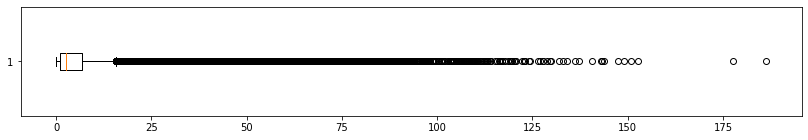

In [19]:
# show boxplot
plt.figure(figsize = (14,2))
plt.boxplot(difference, vert= False);
plt.show()

In [20]:
MAPE = np.mean(abs(100 * (difference/expected)))
MAPE

5.454302276261813